In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import statsmodels.api as sm
from statsmodels.tsa.stattools import acf, pacf, adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pandas.plotting import lag_plot
from statsmodels.tsa.stattools import grangercausalitytests

sns.set_style("darkgrid")
plt.rcParams.update({'font.size': 16})

pd.set_option('display.max_colwidth', 100)
pd.set_option('display.max_columns', 100)

In [2]:
df = pd.read_excel("df_p.xlsx")

Se establece como index la fecha para tratar el conjunto como una Serie Temporal

In [3]:
df = df.set_index(pd.DatetimeIndex(df['date']))

df = df.drop(['date'], axis=1)

Se analiza el conjunto para determinar las caracteristicas con NaN y el porcentaje de NaN en las mismas. Como se observa es bastante alto y como tenemos aproximadamente 500 características podemos eliminar las que tengan NaN. En el caso de la Variable objetivo tiene un porcentaje de NaN inferior al 1 % por lo que pudieramos realizar una interpolación de esos valores o inicialmente probar eliminando esas filas ya que no representan un porciento significativo del total y valorar asi el conjunto.

In [4]:
col_NaN =df.columns[df.isna().any()].tolist()

df_NaN = df[col_NaN ]

In [5]:
percent_missing = df_NaN.isnull().sum() * 100 / len(df_NaN)
missing_value_fund_nan = pd.DataFrame({'column_name': df_NaN.columns,
                                 'percent_missing': percent_missing})

percent_missing

SP500     0.681044
ABBV     42.792281
ALLE     55.391600
CFG      71.396141
CHTR      0.056754
COTY     49.148695
CSRA     83.881952
DLPH     42.792281
EVHC     51.589103
FB       42.792281
FBHS     42.792281
FTV      92.849035
GM       12.599319
HCA      42.792281
HPE      82.746879
KHC      78.547106
KMI      42.792281
KORS     42.792281
LYB       4.483541
MNK      49.262202
MPC      42.792281
NAVI     71.396141
NLSN     42.792281
NWS      49.375709
NWSA     49.375709
PSX      42.792281
PYPL     78.547106
QRVO     71.396141
SYF      71.396141
TDG      42.792281
TRIP     42.792281
WLTW     85.754824
WRK      78.149830
XYL      42.792281
ZTS      43.984109
dtype: float64

Se extrae la variable dependiente para eliminar las columnas con NaN. 

In [6]:
sp500 = df.pop('SP500')

df.head()

,A,AAL,AAP,AAPL,ABBV,ABC,ABT,ACN,ADBE,ADI,ADM,ADP,ADS,ADSK,AEE,AEP,AES,AET,AFL,AGN,AIG,AIV,AIZ,AJG,AKAM,ALB,ALK,ALL,ALLE,ALXN,AMAT,AME,AMG,AMGN,AMP,AMT,AMZN,AN,ANTM,AON,APA,APC,APD,APH,ARNC,ATVI,AVB,AVGO,AVY,AWK,...,ULTA,UNH,UNM,UNP,UPS,URBN,URI,USB,UTX,V,VAR,VFC,VIAB,VLO,VMC,VNO,VRSK,VRSN,VRTX,VTR,VZ,WAT,WBA,WDC,WEC,WFC,WFM,WHR,WLTW,WM,WMB,WMT,WRK,WU,WY,WYN,WYNN,XEC,XEL,XL,XLNX,XOM,XRAY,XRX,XYL,YHOO,YUM,ZBH,ZION,ZTS
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2010-01-04,31.300001,4.77,40.380001,214.009998,NaN,26.629999,54.459951,42.070000,37.090000,31.670000,31.469999,42.830002,65.889999,25.670000,27.760000,34.939999,13.67,33.000000,47.570000,40.290001,29.889999,15.960000,30.160000,22.330000,25.920000,38.090000,34.869999,30.410000,NaN,48.250000,14.30,38.600000,68.879997,57.720001,39.880001,43.459999,133.899994,19.270000,59.750000,37.939999,105.870003,64.739998,83.160000,45.939999,16.650013,11.30,81.199997,18.860001,36.849998,22.650000,...,18.850000,31.530001,19.940001,65.389999,58.180000,34.910000,10.04,22.879999,71.629997,88.139999,47.169998,73.379997,29.980000,17.889997,52.730000,70.019993,29.850000,24.740000,44.240002,43.349998,33.279869,61.630001,37.299999,45.259998,49.730000,27.320000,27.850000,81.949997,NaN,34.160000,21.609949,54.230000,NaN,19.090000,44.279999,20.280001,63.959999,55.169998,21.080000,18.719999,25.379999,69.150002,35.330002,8.63,NaN,17.100000,35.090001,60.020000,13.33,NaN
2010-01-05,30.960001,5.31,40.139999,214.379993,NaN,26.440001,54.019953,42.330002,37.700001,31.620001,31.639999,42.600003,66.019997,25.280001,27.650000,34.540001,13.53,32.529999,48.950001,39.889999,29.330000,16.360001,31.059999,22.209999,26.690001,38.020000,36.779999,30.910000,NaN,47.560001,14.19,38.430000,69.430000,57.220001,40.810001,44.180000,134.690002,19.570000,60.400002,37.700001,107.120003,66.559998,82.470000,44.980000,16.130013,11.32,80.589996,19.000000,37.090000,22.879999,...,18.760000,31.480000,20.230000,66.300003,58.279999,35.560001,9.93,23.459999,70.559998,87.129997,47.840000,74.779999,30.040001,18.350001,52.930000,69.489998,30.049999,25.000000,42.779999,43.560001,33.339868,60.790001,37.000000,46.459999,49.080002,28.070000,27.620001,81.779999,NaN,34.009998,21.879956,53.689999,NaN,19.010000,45.220001,20.709999,67.849998,55.070000,20.830000,18.590000,25.059999,69.419998,34.910000,8.64,NaN,17.230000,34.970000,61.919998,13.80,NaN
2010-01-06,30.850001,5.09,40.490002,210.969995,NaN,26.190001,54.319953,42.779999,37.619999,31.559999,31.559999,42.500004,66.349998,25.340000,27.459999,34.889999,13.39,32.400002,49.380001,40.020000,29.139999,16.650000,30.969999,22.219999,26.469999,38.090000,36.450001,30.920000,NaN,47.680000,14.16,38.470001,70.790001,56.790001,41.380001,44.410000,132.250000,20.320000,61.380001,37.689999,108.800003,67.139999,81.789996,45.150002,16.970013,11.26,79.830002,19.150000,37.009998,23.000000,...,19.219999,31.790001,20.410000,66.400002,57.849998,35.279999,9.93,23.709999,70.190002,85.959999,48.130001,74.480003,29.889999,18.809996,53.849998,69.210001,30.440001,24.730000,42.029999,43.070000,31.919873,60.900002,36.720001,46.500000,49.580002,28.110001,27.940001,81.059998,NaN,34.000000,22.589952,53.570000,NaN,19.000000,44.720001,21.100000,66.959999,54.990002,20.870001,18.400000,24.889999,70.019997,35.139999,8.56,NaN,17.170000,34.720002,61.900002,15.00,NaN
2010-01-07,30.809999,5.24,40.480000,210.580000,NaN,25.770000,54.769952,42.740002,36.889999,31.309999,31.230000,42.480000,66.959999,25.480000,27.200001,35.189999,13.40,33.430000,49.910000,39.700001,28.580000,17.260000,31.350000,22.080000,26.480000,37.820000,36.259998,31.080000,NaN,47.860001,14.01,38.569998,70.470001,56.270000,41.689999,44.290001,130.000000,20.680000,63.660000,37.580002,107.150002,67.029999,81.319994,44.849998,16.610014,10.99,79.989998,19.030001,37.360001,23.049999,...,20.860001,33.009998,20.860001,65.809998,57.410000,34.080002,9.80,24.170000,70.489998,86.760002,47.340000,75.919998,30.200001,18.95

In [7]:
df.dropna(axis=1, inplace=True)

df.head()

,A,AAL,AAP,AAPL,ABC,ABT,ACN,ADBE,ADI,ADM,ADP,ADS,ADSK,AEE,AEP,AES,AET,AFL,AGN,AIG,AIV,AIZ,AJG,AKAM,ALB,ALK,ALL,ALXN,AMAT,AME,AMG,AMGN,AMP,AMT,AMZN,AN,ANTM,AON,APA,APC,APD,APH,ARNC,ATVI,AVB,AVGO,AVY,AWK,AXP,AYI,...,UAA,UAL,UDR,UHS,ULTA,UNH,UNM,UNP,UPS,URBN,URI,USB,UTX,V,VAR,VFC,VIAB,VLO,VMC,VNO,VRSK,VRSN,VRTX,VTR,VZ,WAT,WBA,WDC,WEC,WFC,WFM,WHR,WM,WMB,WMT,WU,WY,WYN,WYNN,XEC,XEL,XL,XLNX,XOM,XRAY,XRX,YHOO,YUM,ZBH,ZION
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2010-01-04,31.300001,4.77,40.380001,214.009998,26.629999,54.459951,42.070000,37.090000,31.670000,31.469999,42.830002,65.889999,25.670000,27.760000,34.939999,13.67,33.000000,47.570000,40.290001,29.889999,15.960000,30.160000,22.330000,25.920000,38.090000,34.869999,30.410000,48.250000,14.30,38.600000,68.879997,57.720001,39.880001,43.459999,133.899994,19.270000,59.750000,37.939999,105.870003,64.739998,83.160000,45.939999,16.650013,11.30,81.199997,18.860001,36.849998,22.650000,40.919998,36.029999,...,28.080000,12.80,16.209999,31.150000,18.850000,31.530001,19.940001,65.389999,58.180000,34.910000,10.04,22.879999,71.629997,88.139999,47.169998,73.379997,29.980000,17.889997,52.730000,70.019993,29.850000,24.740000,44.240002,43.349998,33.279869,61.630001,37.299999,45.259998,49.730000,27.320000,27.850000,81.949997,34.160000,21.609949,54.230000,19.090000,44.279999,20.280001,63.959999,55.169998,21.080000,18.719999,25.379999,69.150002,35.330002,8.63,17.100000,35.090001,60.020000,13.33
2010-01-05,30.960001,5.31,40.139999,214.379993,26.440001,54.019953,42.330002,37.700001,31.620001,31.639999,42.600003,66.019997,25.280001,27.650000,34.540001,13.53,32.529999,48.950001,39.889999,29.330000,16.360001,31.059999,22.209999,26.690001,38.020000,36.779999,30.910000,47.560001,14.19,38.430000,69.430000,57.220001,40.810001,44.180000,134.690002,19.570000,60.400002,37.700001,107.120003,66.559998,82.470000,44.980000,16.130013,11.32,80.589996,19.000000,37.090000,22.879999,40.830002,36.330002,...,28.920000,13.91,16.190001,30.900000,18.760000,31.480000,20.230000,66.300003,58.279999,35.560001,9.93,23.459999,70.559998,87.129997,47.840000,74.779999,30.040001,18.350001,52.930000,69.489998,30.049999,25.000000,42.779999,43.560001,33.339868,60.790001,37.000000,46.459999,49.080002,28.070000,27.620001,81.779999,34.009998,21.879956,53.689999,19.010000,45.220001,20.709999,67.849998,55.070000,20.830000,18.590000,25.059999,69.419998,34.910000,8.64,17.230000,34.970000,61.919998,13.80
2010-01-06,30.850001,5.09,40.490002,210.969995,26.190001,54.319953,42.779999,37.619999,31.559999,31.559999,42.500004,66.349998,25.340000,27.459999,34.889999,13.39,32.400002,49.380001,40.020000,29.139999,16.650000,30.969999,22.219999,26.469999,38.090000,36.450001,30.920000,47.680000,14.16,38.470001,70.790001,56.790001,41.380001,44.410000,132.250000,20.320000,61.380001,37.689999,108.800003,67.139999,81.789996,45.150002,16.970013,11.26,79.830002,19.150000,37.009998,23.000000,41.490002,36.849998,...,29.559999,13.27,16.080000,30.750000,19.219999,31.790001,20.410000,66.400002,57.849998,35.279999,9.93,23.709999,70.190002,85.959999,48.130001,74.480003,29.889999,18.809996,53.849998,69.210001,30.440001,24.730000,42.029999,43.070000,31.919873,60.900002,36.720001,46.500000,49.580002,28.110001,27.940001,81.059998,34.000000,22.589952,53.570000,19.000000,44.720001,21.100000,66.959999,54.990002,20.870001,18.400000,24.889999,70.019997,35.139999,8.56,17.170000,34.720002,61.900002,15.00
2010-01-07,30.809999,5.24,40.480000,210.580000,25.770000,54.769952,42.740002,36.889999,31.309999,31.230000,42.480000,66.959999,25.480000,27.200001,35.189999,13.40,33.430000,49.910000,39.700001,28.580000,17.260000,31.350000,22.080000,26.480000,37.820000,36.259998,31.080000,47.860001,14.01,38.569998,70.470001,56.270000,41.689999,44.290001,130.000000,20.680000,63.660000,37.580002,107.150002,67.029999,81.319994,44.849998,16.610014,10.99,79.989998,19.030001,37.360001,23.049999,41.980000,38.000000,...,29.209999,13.55,16.200001

Se vuelve a insertar la variable dependiente y se eliminan los NaN que existen por filas (Solamente hay NaNs en la columna de la variable dependiente)

In [8]:
df_features = df.copy()

In [9]:
df.insert(0, 'SP500', sp500)

df.dropna(axis=0, inplace=True)

Se divide el dataFrame en subconjuntos para una mejor visualización de los análisis

In [10]:
arra = []
for i in range(0, len(df_features), 24):
    slc = df_features.iloc[:, i : i + 24]
    arra.append(slc)

In [11]:
arra[2]

,AXP,AYI,AZO,BA,BAC,BAX,BBBY,BBT,BBY,BCR,BDX,BEN,BHI,BIIB,BK,BLK,BLL,BMY,BSX,BWA,BXP,C,CA,CAG
date,,,,,,,,,,,,,,,,,,,,,,,,
2010-01-04,40.919998,36.029999,158.029999,56.180000,15.690000,58.289998,39.029999,25.809999,40.189999,78.680000,78.599998,108.000000,41.240002,53.639999,28.290001,238.580002,52.490002,25.629999,9.010000,33.779999,67.099998,3.400000,22.990000,23.110000
2010-01-05,40.830002,36.330002,156.710007,58.020000,16.200001,57.889997,38.669998,26.180000,41.209999,79.349998,77.870003,108.839996,43.660000,53.380001,28.590000,239.610001,51.900002,25.230000,9.040000,35.389999,68.120003,3.530000,22.910000,23.209998
2010-01-06,41.490002,36.849998,155.240005,59.779999,16.389999,58.089998,39.230000,26.580000,40.889999,79.010002,77.660004,108.920002,45.840000,53.430000,28.160000,234.669998,52.000000,25.219999,9.160000,36.689999,68.440002,3.640000,22.760000,23.129999
2010-01-07,41.980000,38.000000,157.300003,62.200001,16.930000,59.029997,41.939999,27.650000,41.540001,80.129997,77.639999,107.939999,46.169998,52.990002,29.350000,237.250000,51.880001,25.240000,9.090000,37.189999,68.739998,3.650000,22.870001,23.199998
2010-01-08,41.950001,38.139999,155.279999,61.599998,16.780001,59.169997,42.029999,27.340000,39.910000,80.510002,77.910004,108.049999,47.099998,54.080002,29.530001,238.919998,52.070000,24.820000,9.000000,36.509998,67.849998,3.590000,23.110001,23.019999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-23,74.970001,234.919998,795.820007,157.809998,22.600000,44.220001,40.770000,47.540001,44.770000,223.100006,166.479996,40.480000,64.930000,287.529999,47.580002,385.739990,76.220001,59.610001,21.809999,39.730000,124.070000,60.990002,32.049999,39.770000
2016-12-27,74.980003,235.589996,803.570007,157.479996,22.610001,44.380001,40.990002,47.709999,44.750000,223.520004,167.059998,40.310001,65.550003,291.119995,47.730000,387.489990,76.470001,59.330002,21.760000,40.099998,124.250000,61.090000,32.230000,39.849998
2016-12-28,74.370003,230.800003,795.890015,156.100006,22.330000,44.189999,40.580002,47.200001,43.709999,222.449997,165.869995,39.470001,64.709999,289.250000,47.650002,381.029999,76.010002,58.610001,21.620001,39.330002,122.459999,60.040001,31.969999,39.540001


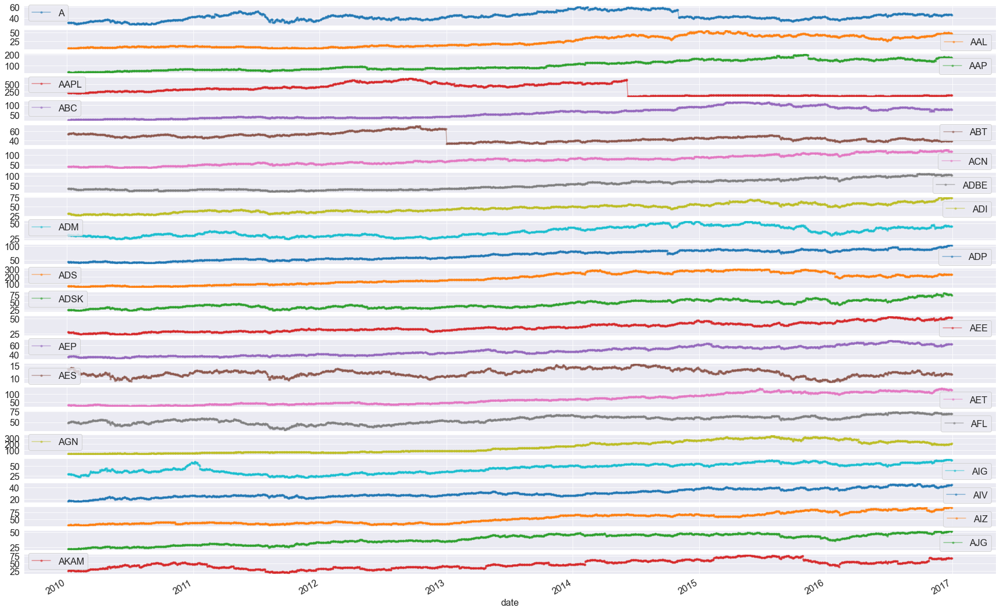

In [12]:
axes = arra[0].iloc[:,:].plot(marker='.', alpha=0.5, linestyle='-', figsize=(30, 20), subplots=True)

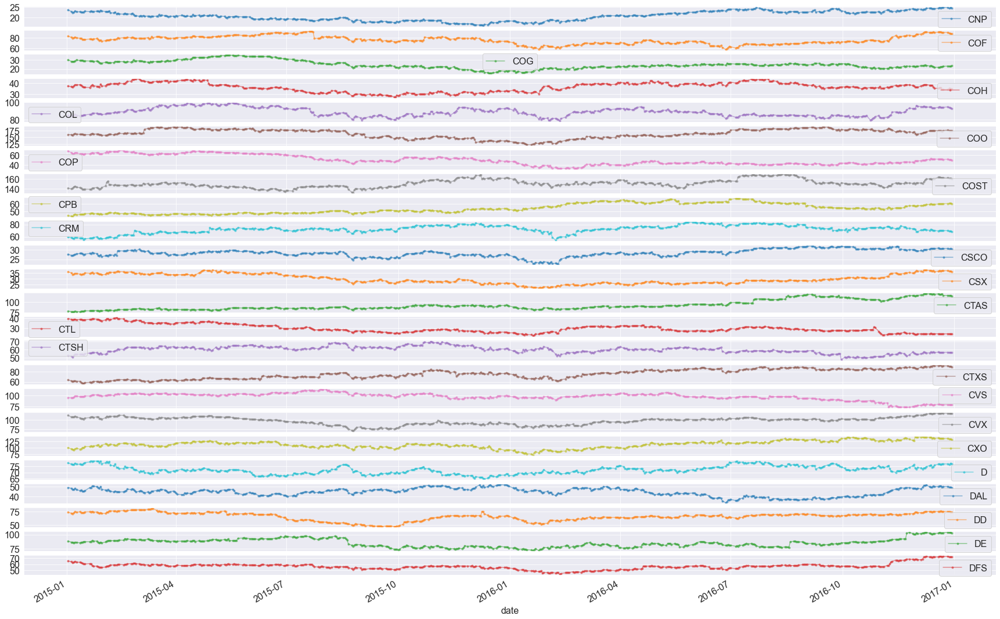

In [13]:
axes = arra[4].loc['2015-01-01':'2016-12-31',:].plot(marker='.', alpha=0.5, linestyle='-', figsize=(30, 20), subplots=True)

In [14]:
print(len(arra))

74


In [15]:
arra = arra[0:19]

Comenzamos a aplicar tecnicas de Analisis de Series Temporales.
Primeramente estudiaremos la correlación de las las caracteristicas. Para esto aplicamos la correlación de kendall a dos Dataframes: 
1. Un primer dataFrame con las features y la variable objetivo con el objetivo de obtener las features con la correlación mas alta con SP500.
2. Un segundo dataFrame solamente con las caracteristicas para determinar las caracteristicas mas correlacionadas entre ellas.

In [16]:
Feat_matrix = df_features.corr(method='kendall')

corr_features = set()

for i in range(len(Feat_matrix.columns)):
    for j in range(i):
        if abs(Feat_matrix.iloc[i, j]) > 0.9:
            colname = Feat_matrix.columns[i]
            corr_features.add(colname)

print(len(corr_features), corr_features)

28 {'CB', 'MMC', 'EIX', 'HD', 'CMS', 'PNW', 'HON', 'MTD', 'STZ', 'CTAS', 'EFX', 'SPGI', 'FOXA', 'GOOGL', 'MMM', 'EXR', 'NEE', 'UNH', 'INTU', 'HSIC', 'DISCK', 'PSA', 'ES', 'DTE', 'MO', 'SPG', 'XEL', 'ORLY'}


In [17]:
corr_matrix = df.corr(method='kendall')

correlated_features = set()

for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) > 0.9:
            colname = corr_matrix.columns[i]
            correlated_features.add(colname)

print(len(correlated_features), correlated_features)


29 {'CB', 'MMC', 'EIX', 'HD', 'CMS', 'PNW', 'HON', 'MTD', 'STZ', 'CTAS', 'EFX', 'SPGI', 'FOXA', 'GOOGL', 'MMM', 'EXR', 'NEE', 'UNH', 'INTU', 'HSIC', 'DISCK', 'PSA', 'CMCSA', 'ES', 'DTE', 'MO', 'SPG', 'XEL', 'ORLY'}


In [18]:
if correlated_features == corr_features:
    print("Are equals")
else:
    print("The features arn´t equals")

The features arn´t equals


In [19]:
MC_features = list(set(correlated_features) | set(corr_features))

print(len(MC_features), MC_features)

29 ['CB', 'MMC', 'EIX', 'HD', 'CMS', 'PNW', 'HON', 'MTD', 'STZ', 'CTAS', 'EFX', 'SPGI', 'FOXA', 'GOOGL', 'MMM', 'NEE', 'EXR', 'UNH', 'INTU', 'HSIC', 'DISCK', 'PSA', 'CMCSA', 'ES', 'DTE', 'MO', 'SPG', 'XEL', 'ORLY']


Hemos identificado mediante el metodo de kendall 29 caracteristicas con una alta correlacion tanto con la variable objetivo como con el conjunto de caracteristicas.

In [20]:
corr_arr = []
for i in range(0, len(arra)):
    #arra[i].insert(0, 'SP500', sp500)
    #arra[i].dropna(axis=0, inplace=True)
    corr = arra[i].corr(method='kendall')
    corr_arr.append(corr)

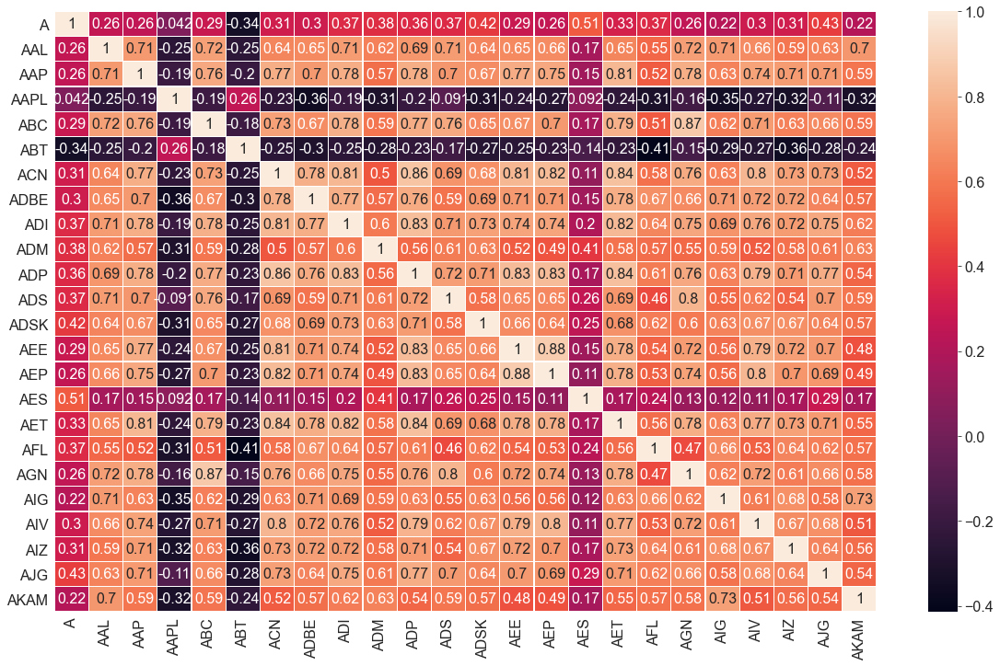

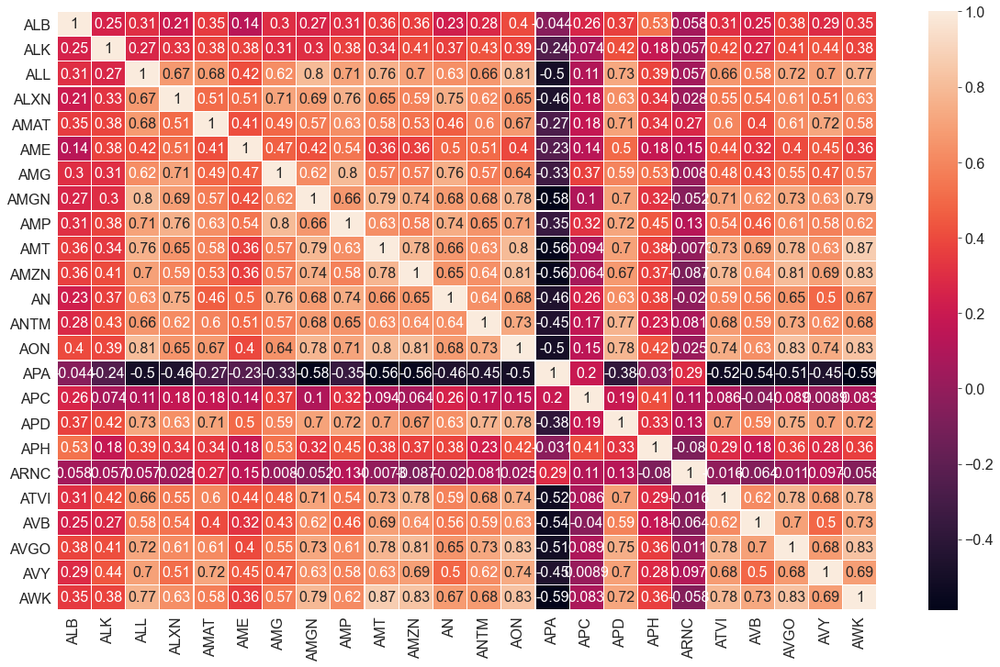

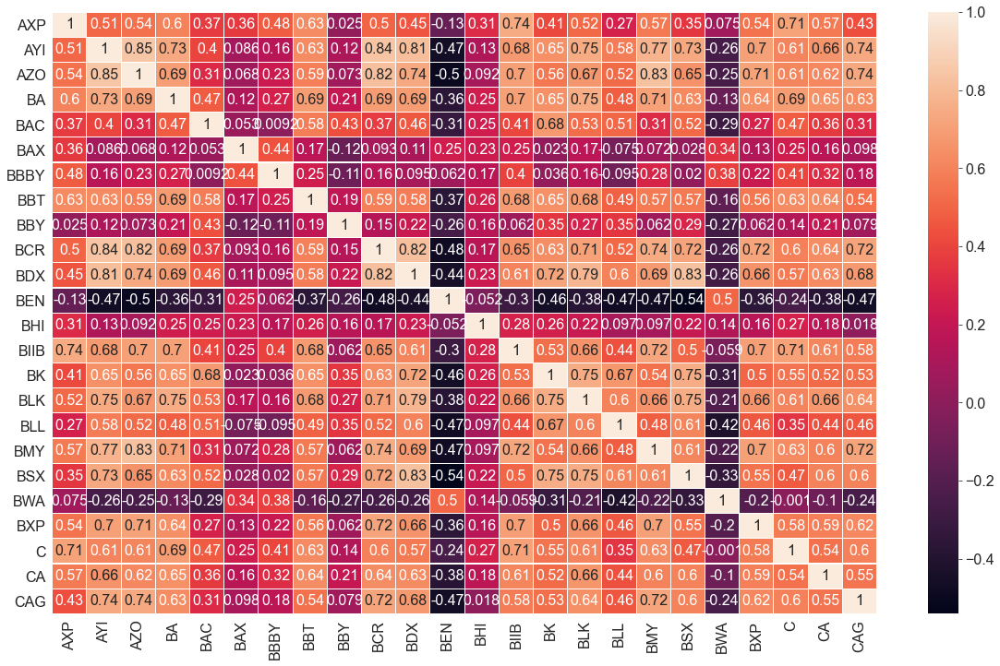

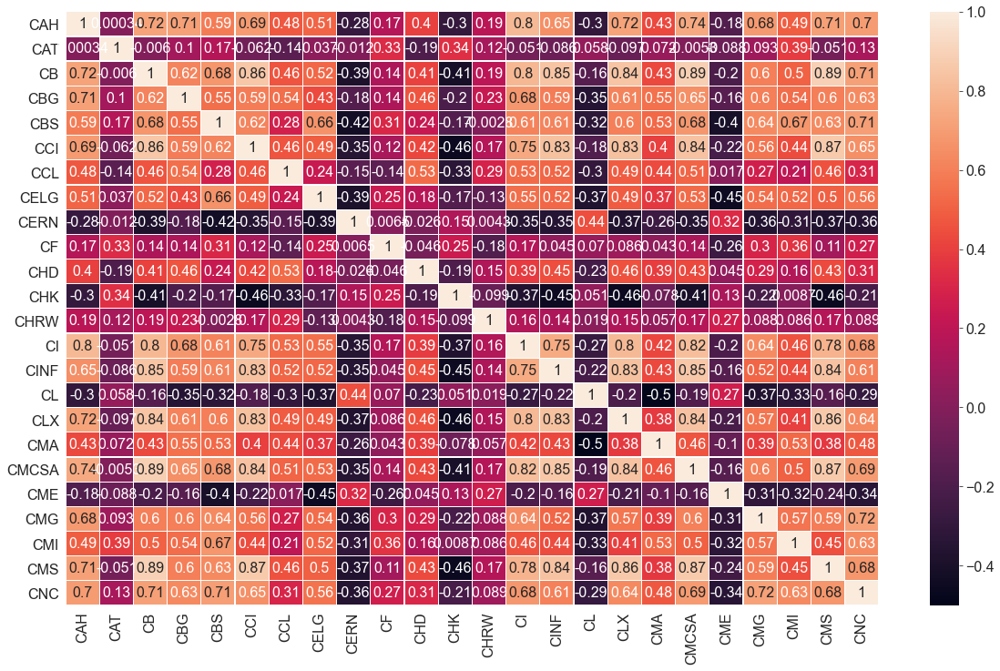

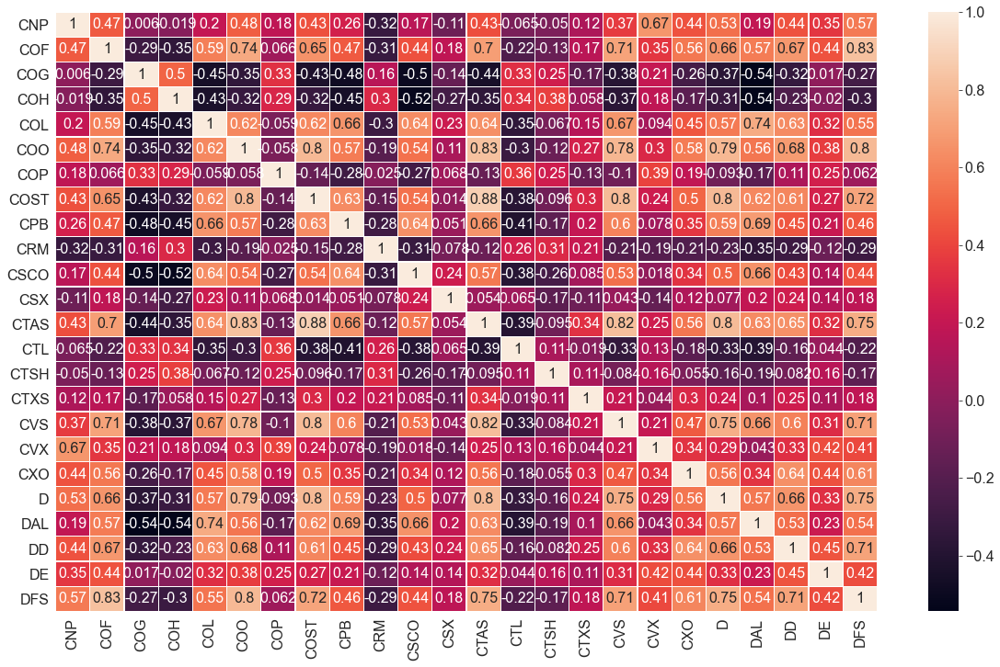

...

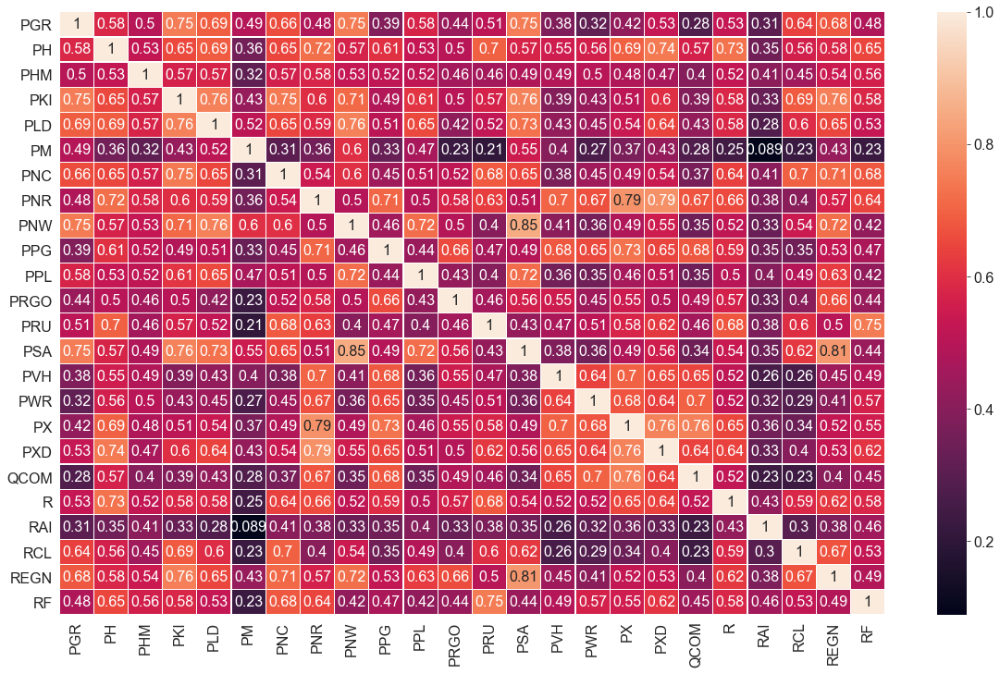

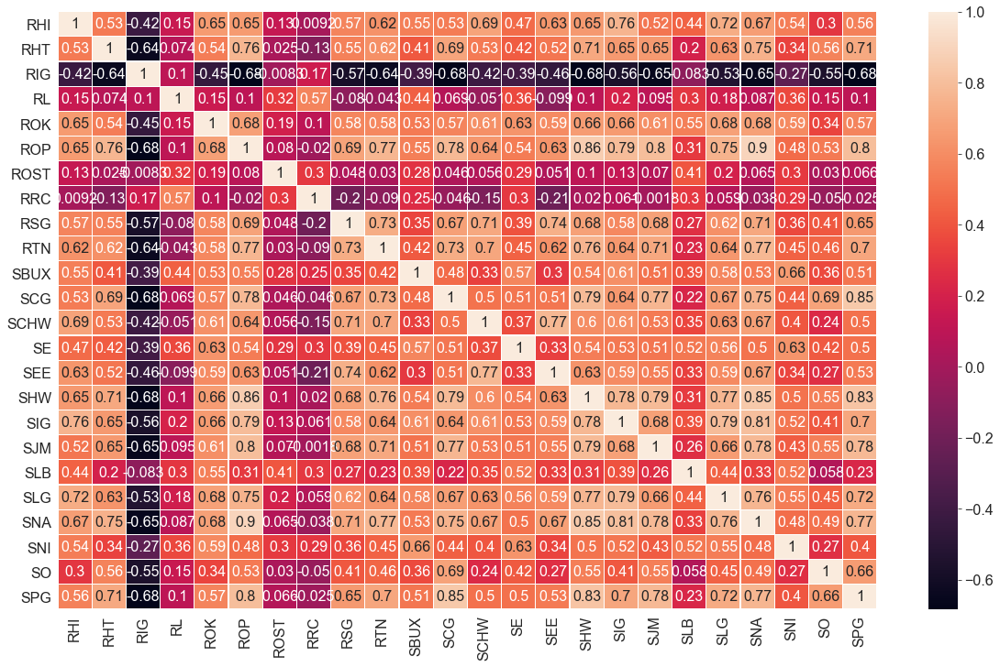

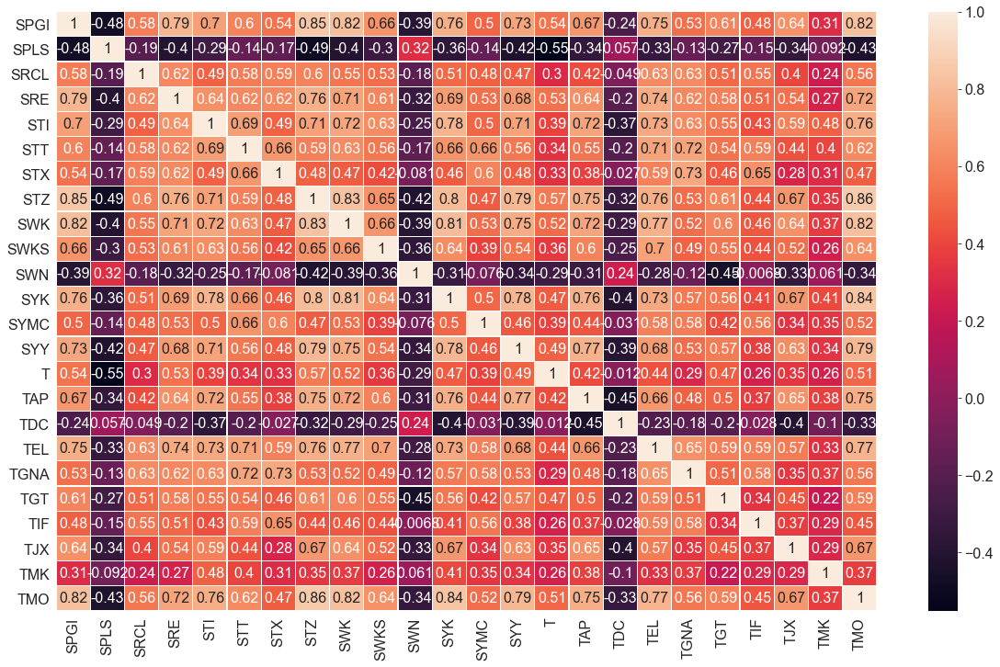

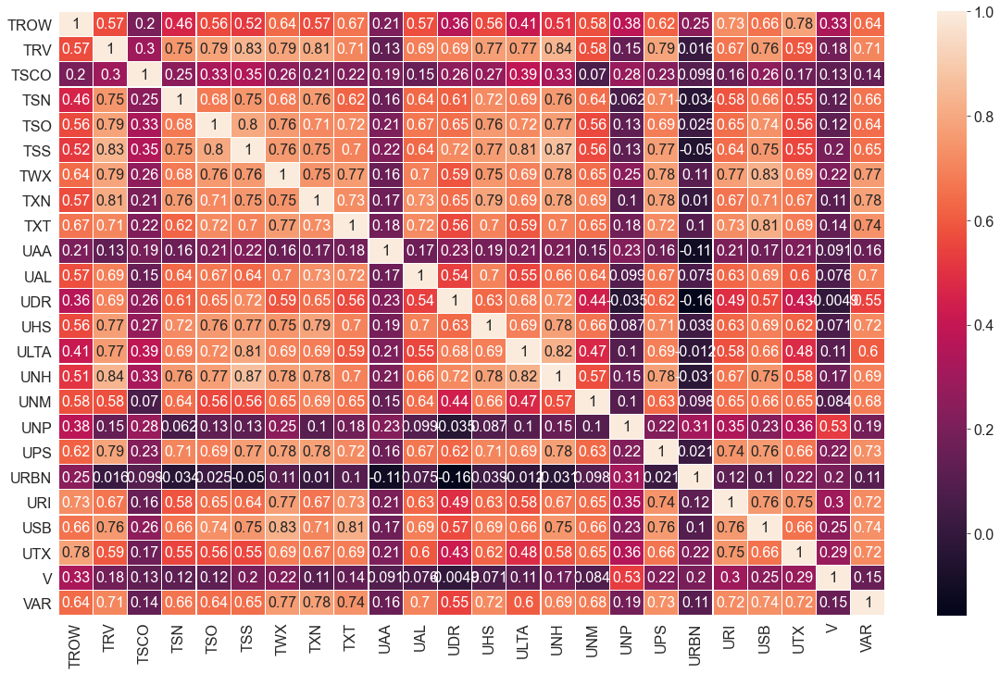

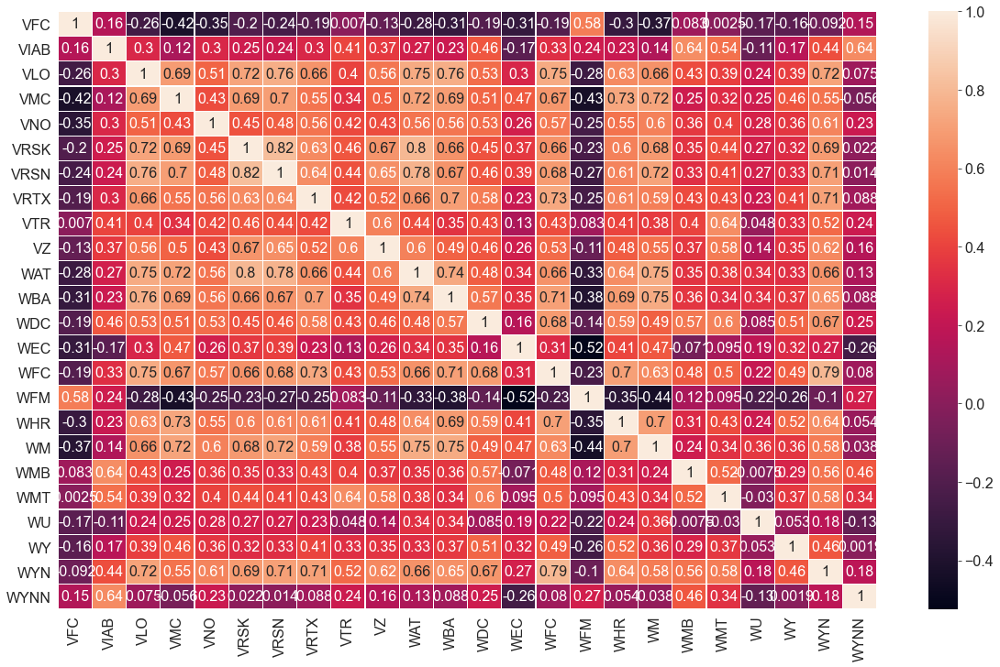

In [21]:
for i in range(len(corr_arr)):
    sns.heatmap( corr_arr[i] ,annot=True,linewidths=0.2, xticklabels=True, yticklabels=True )
    fig=plt.gcf()
    fig.set_size_inches(20,12)
    plt.show()

In [22]:
correlation_values = df.corr(method='kendall').loc['SP500'].abs().sort_values(ascending=False)

correlation_values

SP500    1.000000
MMC      0.910116
HON      0.907011
CMCSA    0.905416
AON      0.896275
           ...   
IBM      0.026650
RRC      0.026231
NRG      0.013422
NKE      0.010198
PBI      0.007431
Name: SP500, Length: 468, dtype: float64

In [23]:
corr_Filtered = list(map(lambda x: x > 0.35, correlation_values))

In [24]:
corr_Filtered = correlation_values[corr_Filtered]

corr_Filtered

SP500    1.000000
MMC      0.910116
HON      0.907011
CMCSA    0.905416
AON      0.896275
           ...   
TMK      0.364988
HRL      0.359178
CHK      0.356752
SWN      0.355696
FTI      0.353035
Name: SP500, Length: 381, dtype: float64

In [25]:
df_1 = df[corr_Filtered.index].copy()

df_1.head()

,SP500,MMC,HON,CMCSA,AON,ADP,ITW,INTU,CTAS,SPGI,MCO,ADI,SNA,MTD,ROP,EFX,HSIC,OMC,CB,FIS,STZ,TWX,SHW,MMM,IFF,AYI,TRV,COO,UNH,DIS,HD,MHK,SWK,ECL,PKI,AET,NEE,ACN,GPC,AWK,ALL,TMO,COST,USB,PAYX,JBHT,TSS,AMT,LMT,TXN,...,CCL,WMT,GS,DOV,APA,PCG,PM,PWR,NI,PVH,QCOM,HP,MET,WMB,APH,HST,CNP,EXC,WY,XOM,NUE,AME,SPLS,BAC,LKQ,IRM,CHD,FE,EW,COG,ALB,GLW,FLS,HAL,GPS,DE,SLB,FFIV,RAI,A,NBL,BEN,WEC,DLR,ALK,TMK,HRL,CHK,SWN,FTI
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2010-01-04,1132.99,21.870001,40.349998,16.969999,37.939999,42.830002,48.570000,30.809999,26.389999,33.610001,27.27,31.670000,42.860001,105.639999,52.540001,31.469999,53.430000,39.619999,49.27,23.820000,16.120001,29.419995,61.669998,83.019997,42.009998,36.029999,49.810001,37.750000,31.530001,32.070000,28.670000,48.310001,52.709999,45.250000,20.639999,33.000000,53.250000,42.070000,38.130001,22.650000,30.410000,47.500000,59.410000,22.879999,30.820000,33.060001,17.209999,43.459999,76.849998,26.010000,...,32.060001,54.230000,173.080002,42.360001,105.870003,44.500000,49.349998,21.240000,15.510001,41.099998,46.939999,41.980000,36.299999,21.609949,45.939999,11.82,14.52,48.880001,44.279999,69.150002,47.790001,38.600000,24.500000,15.690000,19.690001,22.890002,61.340000,46.770000,87.470001,46.230000,38.090000,19.559999,97.009998,31.250000,20.540001,56.060001,67.110001,53.980000,53.240002,31.300001,73.220001,108.000000,49.730000,50.150002,34.869999,44.759992,38.279999,28.090001,50.830002,59.230000
2010-01-05,1136.52,21.340000,40.430000,16.740000,37.700001,42.600003,48.439999,30.809999,26.350000,33.639999,26.99,31.620001,42.840000,103.000000,51.869999,31.459999,53.279999,39.480000,48.16,24.840000,15.920000,29.089999,60.209999,82.500000,41.700001,36.330002,48.630001,38.189999,31.480000,31.990000,28.879999,48.119999,53.480000,44.560001,20.889999,32.529999,52.730000,42.330002,38.090000,22.879999,30.910000,47.660000,59.230000,23.459999,30.799999,33.150002,17.209999,44.180000,77.650002,25.860001,...,32.369999,53.689999,176.139999,42.160002,107.120003,44.000000,48.919998,21.330000,15.470001,42.639999,48.070000,44.430000,37.139999,21.879956,44.980000,12.09,14.41,48.080002,45.220001,69.419998,48.119999,38.430000,24.520000,16.200001,19.830000,22.959996,60.509998,46.250000,88.099998,46.169998,38.020000,19.629999,98.090000,31.650000,20.790001,55.849998,67.300003,52.520000,53.299999,30.960001,75.120003,108.839996,49.080002,50.480000,36.779999,45.780008,38.480000,28.970002,51.650002,60.250000
2010-01-06,1137.14,21.990000,40.430000,16.620001,37.689999,42.500004,48.330002,30.379999,26.420000,33.340000,26.42,31.559999,43.080002,102.209999,52.270000,31.799999,53.450001,39.169998,47.50,24.700001,16.129999,29.020003,59.419998,83.669998,41.869999,36.849998,47.939999,38.169998,31.790001,31.820000,28.780001,47.930000,54.820000,44.430000,21.299999,32.400002,53.250000,42.779999,38.020000,23.000000,30.920000,48.110001,60.000000,23.709999,31.049999,32.950001,16.889999,44.410000,76.510002,25.670000,...,31.790001,53.570000,174.259995,42.660000,108.800003,44.509998,48.919998,21.940001,15.290001,43.660000,47.599998,46.049999,37.520000,22.589952,45.150002,12.16,14.27,48.369999,44.720001,70.019997,49.570000,38.470001,24.580000,16.389999,19.799999,23.699998,60.799999,46.750000,89.070000,45.970001,38.090000,19.379999,100.799995,32.400002,21.040001,55.700001,68.800003,52.759998,53.990002,30.850001,75.830002,108.920002,49.580002,49.799999,36.450001,46.109993,38.270000,28.650002,51.400002,60.529999
2010-01-07,1141.69,22.270000,41.209999,16.969999,37.580002,42.480000,48.639999,30.280001,26.650000,34.080002,26.34,31.309999,43.799999,100.440002,52.070000,31.930000,53.639999,38.939999,47.77,24.559999,15.970000,28.719995,59.950001,83.730003,41.549999,38.000000,48.630001,38.570000,33.009998,31.830000,29.120001,48.770000,56.750000,44.910000,21.240000,33.430000,53.099998,42.740002,38.230000,23.049999,31.080000,48.110001,59.709999,24.170000,31.540001,33.080002,16.780001,44.290001,7

In [26]:
df.head()

,SP500,A,AAL,AAP,AAPL,ABC,ABT,ACN,ADBE,ADI,ADM,ADP,ADS,ADSK,AEE,AEP,AES,AET,AFL,AGN,AIG,AIV,AIZ,AJG,AKAM,ALB,ALK,ALL,ALXN,AMAT,AME,AMG,AMGN,AMP,AMT,AMZN,AN,ANTM,AON,APA,APC,APD,APH,ARNC,ATVI,AVB,AVGO,AVY,AWK,AXP,...,UAA,UAL,UDR,UHS,ULTA,UNH,UNM,UNP,UPS,URBN,URI,USB,UTX,V,VAR,VFC,VIAB,VLO,VMC,VNO,VRSK,VRSN,VRTX,VTR,VZ,WAT,WBA,WDC,WEC,WFC,WFM,WHR,WM,WMB,WMT,WU,WY,WYN,WYNN,XEC,XEL,XL,XLNX,XOM,XRAY,XRX,YHOO,YUM,ZBH,ZION
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2010-01-04,1132.99,31.300001,4.77,40.380001,214.009998,26.629999,54.459951,42.070000,37.090000,31.670000,31.469999,42.830002,65.889999,25.670000,27.760000,34.939999,13.67,33.000000,47.570000,40.290001,29.889999,15.960000,30.160000,22.330000,25.920000,38.090000,34.869999,30.410000,48.250000,14.30,38.600000,68.879997,57.720001,39.880001,43.459999,133.899994,19.270000,59.750000,37.939999,105.870003,64.739998,83.160000,45.939999,16.650013,11.30,81.199997,18.860001,36.849998,22.650000,40.919998,...,28.080000,12.80,16.209999,31.150000,18.850000,31.530001,19.940001,65.389999,58.180000,34.910000,10.04,22.879999,71.629997,88.139999,47.169998,73.379997,29.980000,17.889997,52.730000,70.019993,29.850000,24.740000,44.240002,43.349998,33.279869,61.630001,37.299999,45.259998,49.730000,27.320000,27.850000,81.949997,34.160000,21.609949,54.230000,19.090000,44.279999,20.280001,63.959999,55.169998,21.080000,18.719999,25.379999,69.150002,35.330002,8.63,17.100000,35.090001,60.020000,13.33
2010-01-05,1136.52,30.960001,5.31,40.139999,214.379993,26.440001,54.019953,42.330002,37.700001,31.620001,31.639999,42.600003,66.019997,25.280001,27.650000,34.540001,13.53,32.529999,48.950001,39.889999,29.330000,16.360001,31.059999,22.209999,26.690001,38.020000,36.779999,30.910000,47.560001,14.19,38.430000,69.430000,57.220001,40.810001,44.180000,134.690002,19.570000,60.400002,37.700001,107.120003,66.559998,82.470000,44.980000,16.130013,11.32,80.589996,19.000000,37.090000,22.879999,40.830002,...,28.920000,13.91,16.190001,30.900000,18.760000,31.480000,20.230000,66.300003,58.279999,35.560001,9.93,23.459999,70.559998,87.129997,47.840000,74.779999,30.040001,18.350001,52.930000,69.489998,30.049999,25.000000,42.779999,43.560001,33.339868,60.790001,37.000000,46.459999,49.080002,28.070000,27.620001,81.779999,34.009998,21.879956,53.689999,19.010000,45.220001,20.709999,67.849998,55.070000,20.830000,18.590000,25.059999,69.419998,34.910000,8.64,17.230000,34.970000,61.919998,13.80
2010-01-06,1137.14,30.850001,5.09,40.490002,210.969995,26.190001,54.319953,42.779999,37.619999,31.559999,31.559999,42.500004,66.349998,25.340000,27.459999,34.889999,13.39,32.400002,49.380001,40.020000,29.139999,16.650000,30.969999,22.219999,26.469999,38.090000,36.450001,30.920000,47.680000,14.16,38.470001,70.790001,56.790001,41.380001,44.410000,132.250000,20.320000,61.380001,37.689999,108.800003,67.139999,81.789996,45.150002,16.970013,11.26,79.830002,19.150000,37.009998,23.000000,41.490002,...,29.559999,13.27,16.080000,30.750000,19.219999,31.790001,20.410000,66.400002,57.849998,35.279999,9.93,23.709999,70.190002,85.959999,48.130001,74.480003,29.889999,18.809996,53.849998,69.210001,30.440001,24.730000,42.029999,43.070000,31.919873,60.900002,36.720001,46.500000,49.580002,28.110001,27.940001,81.059998,34.000000,22.589952,53.570000,19.000000,44.720001,21.100000,66.959999,54.990002,20.870001,18.400000,24.889999,70.019997,35.139999,8.56,17.170000,34.720002,61.900002,15.00
2010-01-07,1141.69,30.809999,5.24,40.480000,210.580000,25.770000,54.769952,42.740002,36.889999,31.309999,31.230000,42.480000,66.959999,25.480000,27.200001,35.189999,13.40,33.430000,49.910000,39.700001,28.580000,17.260000,31.350000,22.080000,26.480000,37.820000,36.259998,31.080000,47.860001,14.01,38.569998,70.470001,56.270000,41.689999,44.290001,130.000000,20.680000,63.660000,37.580002,107.150002,67.029999,81.319994,44.849998,16.610014,10.99,79.989998,19.030001,37.360001,23.049999,41.980000,...,29.209999,13.55,16.200001,31.20

Text(0.5, 0.98, 'MEAN de SP500, NVDA y FAST')

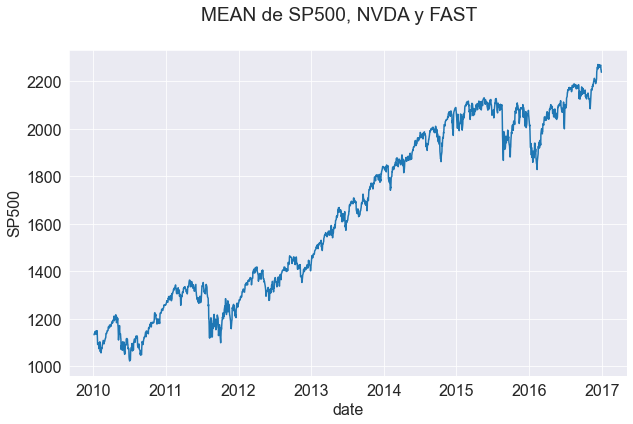

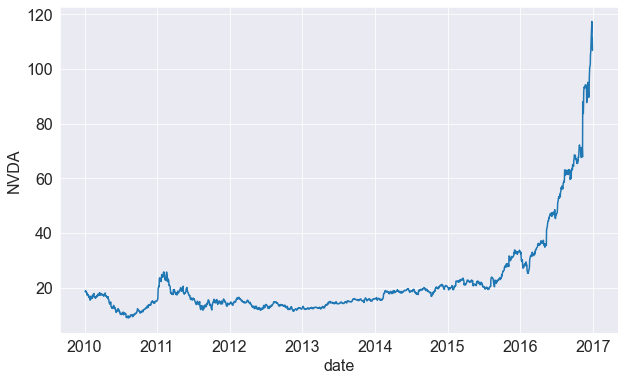

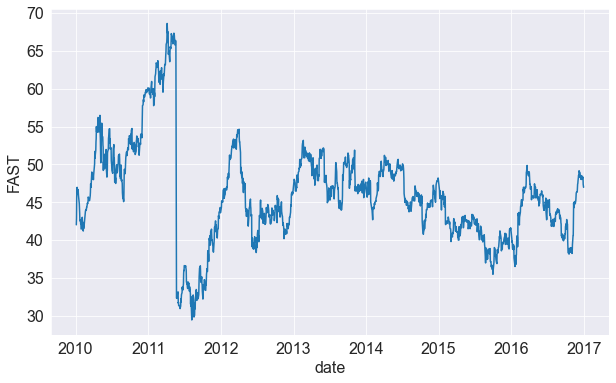

<Figure size 720x432 with 0 Axes>

In [27]:
d = df.groupby(["date"]).mean()
fig = plt.figure(figsize=(10,6))
sns.lineplot(x=d.index, y= d["SP500"])
plt.figure(figsize=(10,6))
sns.lineplot(x=d.index, y= d["NVDA"])
plt.figure(figsize=(10,6))
sns.lineplot(x=d.index, y= d["FAST"])
plt.figure(figsize=(10,6))
fig.suptitle("MEAN de SP500, NVDA y FAST") 

In [28]:
#for i in range(len(arra)):
#    arra[i].pop('SP500')

Creamos un dataframe para salvar los valores de p-value por caracteristicas

In [29]:
feat_p_values = pd.DataFrame(columns=['Features', 'p_values'])

feat_p_values.info()

<class 'pandas.core.frame.DataFrame'>
Index: 0 entries
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Features  0 non-null      object
 1   p_values  0 non-null      object
dtypes: object(2)
memory usage: 0.0+ bytes


Realizamos el test Augmented Dickey Fuller, este test comprueba la estacionalidad de las caracteristicas a analizar. Si el test es nulo (entonces la feature es una raiz unataria en caso contrario seria estacional). Como se observa en los valores casi todas las features presentan estacionalidad en mayor o menor grado

In [30]:

for i in range(len(arra)):
  for col in arra[i].columns:
    result = adfuller(arra[i][col], autolag='AIC')
    
    new_row = pd.Series(data={'Features':col, 'p_values':result[1]})
    
    feat_p_values = feat_p_values.append(new_row, ignore_index=True)
    
    
    print(col)
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
      print('\t%s: %.3f' % (key, value))

A
ADF Statistic: -2.234893
p-value: 0.193826
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
AAL
ADF Statistic: -0.694607
p-value: 0.848142
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
AAP
ADF Statistic: -0.881018
p-value: 0.794159
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
AAPL
ADF Statistic: -1.523944
p-value: 0.521635
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
ABC
ADF Statistic: -1.165981
p-value: 0.688056
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
ABT
ADF Statistic: -2.165256
p-value: 0.219096
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
ACN
ADF Statistic: -0.275665
p-value: 0.928881
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
ADBE
ADF Statistic: 0.470236
p-value: 0.983940
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
ADI
ADF Statistic: -0.646952
p-value: 0.860016
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
ADM
ADF Statistic: -1.427897
p-value: 0.568831
Critical Values:
	1%: -3.434
	5%: -2.863
	10%

CHD
ADF Statistic: -2.085670
p-value: 0.250316
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
CHK
ADF Statistic: -1.165974
p-value: 0.688059
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
CHRW
ADF Statistic: -2.731377
p-value: 0.068764
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
CI
ADF Statistic: -0.539679
p-value: 0.884038
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
CINF
ADF Statistic: 0.394281
p-value: 0.981280
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
CL
ADF Statistic: -2.211561
p-value: 0.202076
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
CLX
ADF Statistic: -0.544765
p-value: 0.882981
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
CMA
ADF Statistic: -0.314493
p-value: 0.923426
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
CMCSA
ADF Statistic: -0.528809
p-value: 0.886271
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
CME
ADF Statistic: -1.935049
p-value: 0.315757
Critical Values:
	1%: -3.434
	5%: -2.863
	1

FAST
ADF Statistic: -3.460480
p-value: 0.009062
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
FCX
ADF Statistic: -1.794843
p-value: 0.383025
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
FDX
ADF Statistic: -0.512701
p-value: 0.889514
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
FE
ADF Statistic: -2.305466
p-value: 0.170211
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
FFIV
ADF Statistic: -2.642250
p-value: 0.084576
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
FIS
ADF Statistic: -0.158371
p-value: 0.943305
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
FISV
ADF Statistic: -1.591283
p-value: 0.487971
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
FITB
ADF Statistic: -0.666454
p-value: 0.855248
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
FL
ADF Statistic: -0.511188
p-value: 0.889815
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
FLIR
ADF Statistic: -1.731343
p-value: 0.415040
Critical Values:
	1%: -3.434
	5%: -2.863


KMX
ADF Statistic: -1.162505
p-value: 0.689514
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
KO
ADF Statistic: -1.795104
p-value: 0.382895
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
KR
ADF Statistic: -1.670568
p-value: 0.446337
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
KSS
ADF Statistic: -2.850213
p-value: 0.051451
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
KSU
ADF Statistic: -1.907743
p-value: 0.328427
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
L
ADF Statistic: -2.070601
p-value: 0.256499
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
LB
ADF Statistic: -1.668521
p-value: 0.447400
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
LEG
ADF Statistic: -0.592896
p-value: 0.872579
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
LEN
ADF Statistic: -1.367286
p-value: 0.597856
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
LH
ADF Statistic: -1.371148
p-value: 0.596027
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.

PCLN
ADF Statistic: -0.990416
p-value: 0.756744
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
PDCO
ADF Statistic: -1.787382
p-value: 0.386744
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
PEG
ADF Statistic: -1.470426
p-value: 0.548087
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
PEP
ADF Statistic: -0.757094
p-value: 0.831402
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
PFE
ADF Statistic: -1.157827
p-value: 0.691470
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
PFG
ADF Statistic: -0.699796
p-value: 0.846802
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
PG
ADF Statistic: -1.468779
p-value: 0.548895
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
PGR
ADF Statistic: -0.542336
p-value: 0.883487
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
PH
ADF Statistic: -1.554931
p-value: 0.506184
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
PHM
ADF Statistic: -1.388930
p-value: 0.587572
Critical Values:
	1%: -3.434
	5%: -2.863
	10

TSS
ADF Statistic: -0.519267
p-value: 0.888201
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
TWX
ADF Statistic: -0.260761
p-value: 0.930881
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
TXN
ADF Statistic: 0.092834
p-value: 0.965568
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
TXT
ADF Statistic: -1.058064
p-value: 0.731502
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
UAA
ADF Statistic: -2.479101
p-value: 0.120642
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
UAL
ADF Statistic: -0.757959
p-value: 0.831160
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
UDR
ADF Statistic: -1.646477
p-value: 0.458879
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
UHS
ADF Statistic: -1.051084
p-value: 0.734180
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
ULTA
ADF Statistic: 0.240057
p-value: 0.974421
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
UNH
ADF Statistic: 1.876387
p-value: 0.998489
Critical Values:
	1%: -3.434
	5%: -2.863
	10%:

In [31]:
feat_p_values.head()

,Features,p_values
0,A,0.193826
1,AAL,0.848142
2,AAP,0.794159
3,AAPL,0.521635
4,ABC,0.688056


Con el siguiente test se comprueba la autocorrelación de las features total y parcial. Este test  nos muestra hasta cuantos lag de tiempos podemos predecir estas features

# Con esta celda podemos comprobar la autocorrelacion y correlación parcial de cada accion respecto a si misma. 
# Para comprobar su posibilidad de utilización para forecasting
for i in range(len(arra)):
  for col in arra[i].columns:
    fig, axes = plt.subplots(1,2,figsize=(16,3), dpi= 90)
    plot_acf(arra[i][col].tolist(), lags=50, ax=axes[0], title='Autocorrelation '+ col)
    plot_pacf(arra[i][col].tolist(), lags=50, ax=axes[1], title='Partial Autocorrelation '+ col)

<ipython-input-32-aa90cbdc4618>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(1,2,figsize=(16,3), dpi= 90)
<ipython-input-32-aa90cbdc4618>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(1,2,figsize=(16,3), dpi= 90)
<ipython-input-32-aa90cbdc4618>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fig

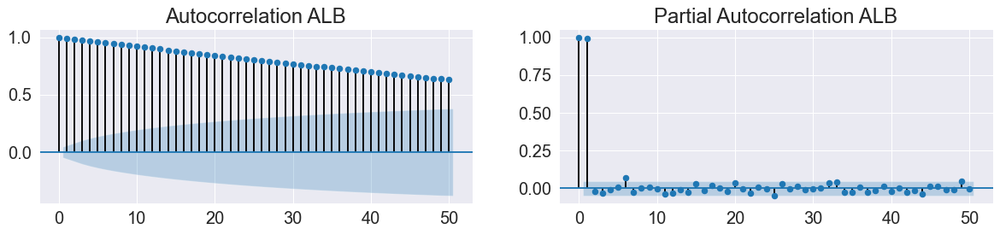

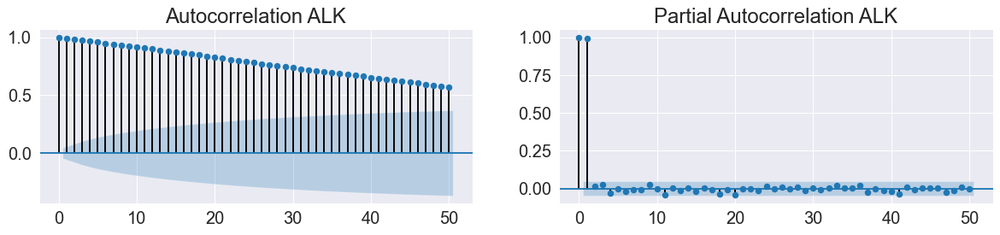

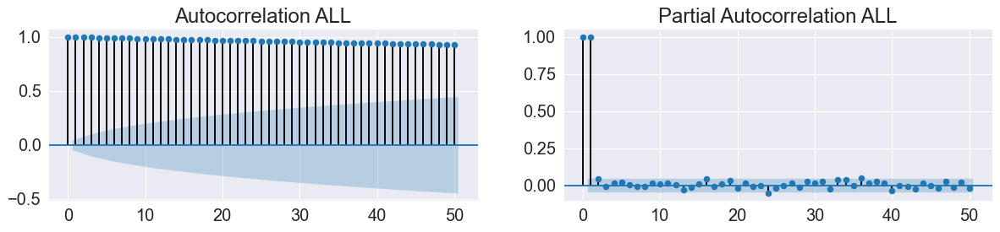

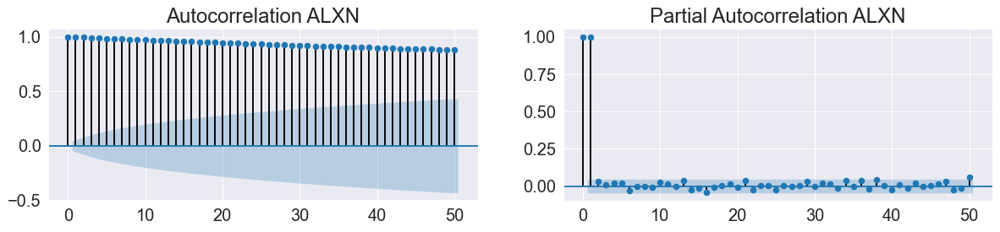

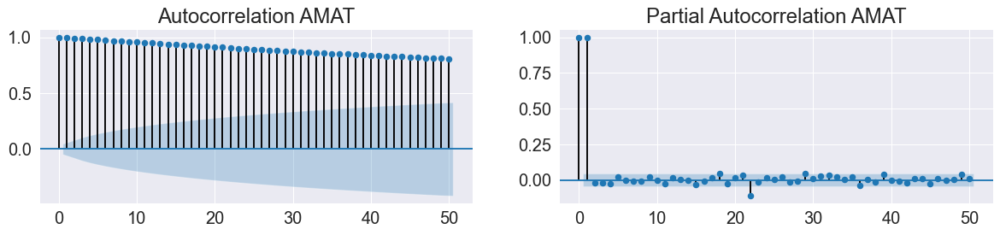

...

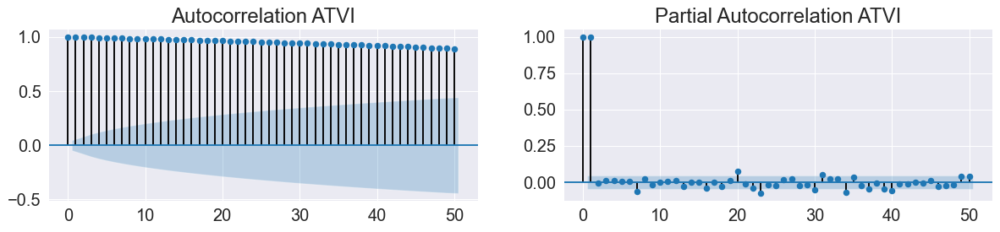

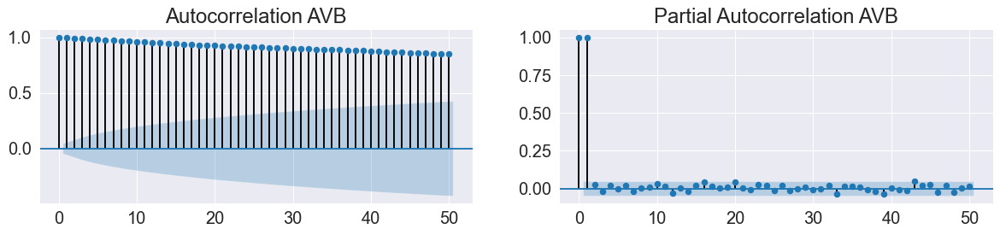

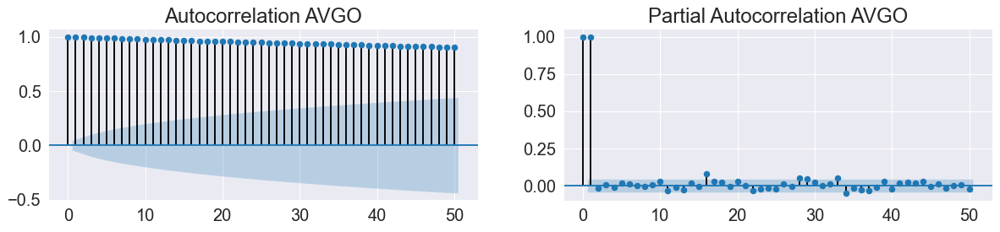

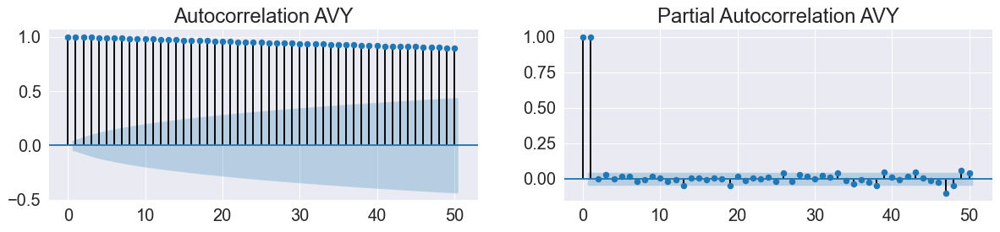

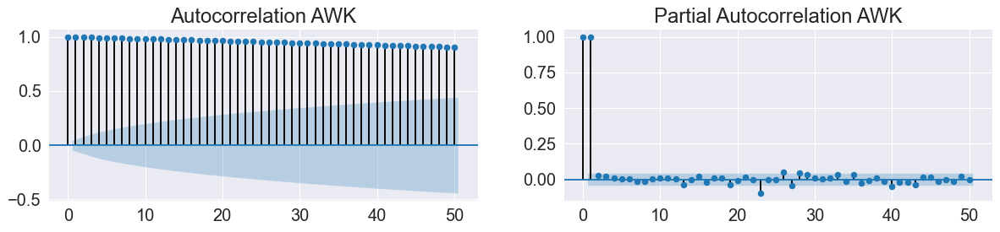

In [32]:
# Igual a la anterior pero solo usaremos un segmento para vizualización
for col in arra[1].columns:
    fig, axes = plt.subplots(1,2,figsize=(16,3), dpi= 90)
    plot_acf(arra[1][col].tolist(), lags=50, ax=axes[0], title='Autocorrelation '+ col)
    plot_pacf(arra[1][col].tolist(), lags=50, ax=axes[1], title='Partial Autocorrelation '+ col)

# Con esta grafica comprobación la autocorrelación de las acciones con sus propios lags
for i in range(len(arra)):
  for col in arra[i].columns:
    plt.figure(figsize=(16,6))
    pd.plotting.autocorrelation_plot(arra[i][col])

<ipython-input-42-9e5ac2eeb94b>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,6))
<ipython-input-42-9e5ac2eeb94b>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,6))
<ipython-input-42-9e5ac2eeb94b>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,6))
<

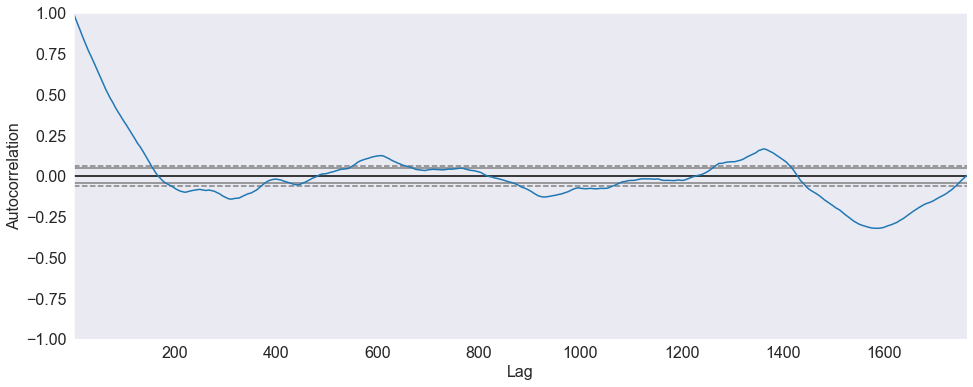

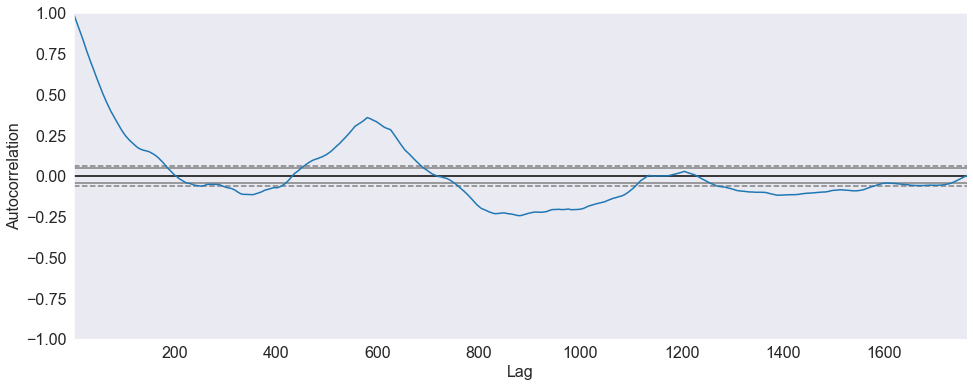

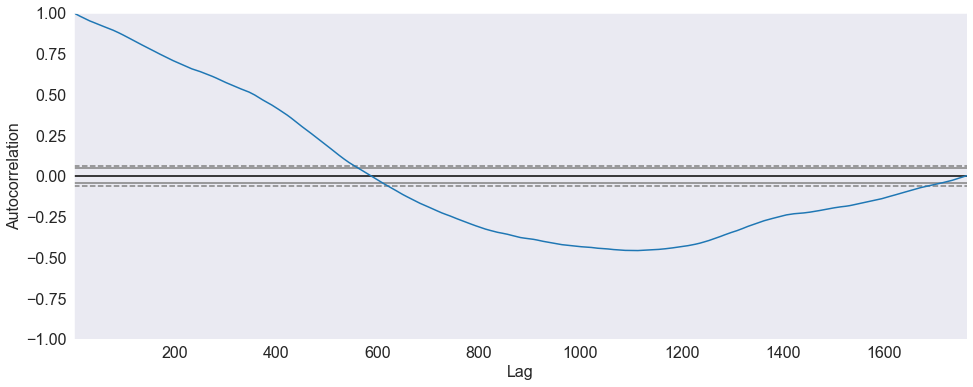

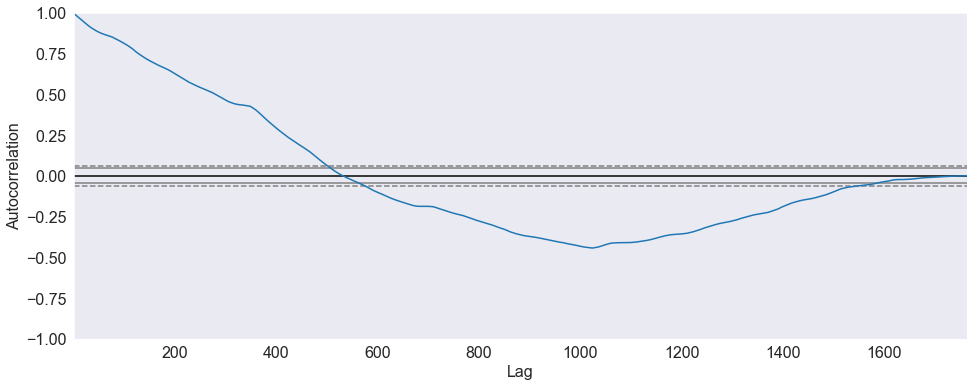

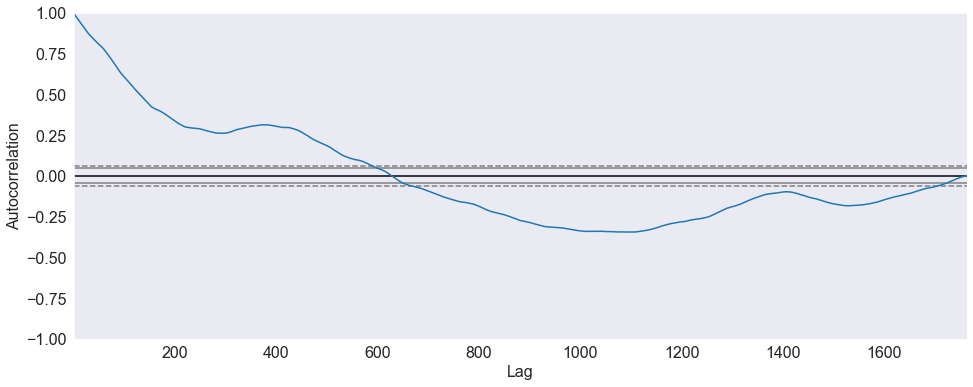

...

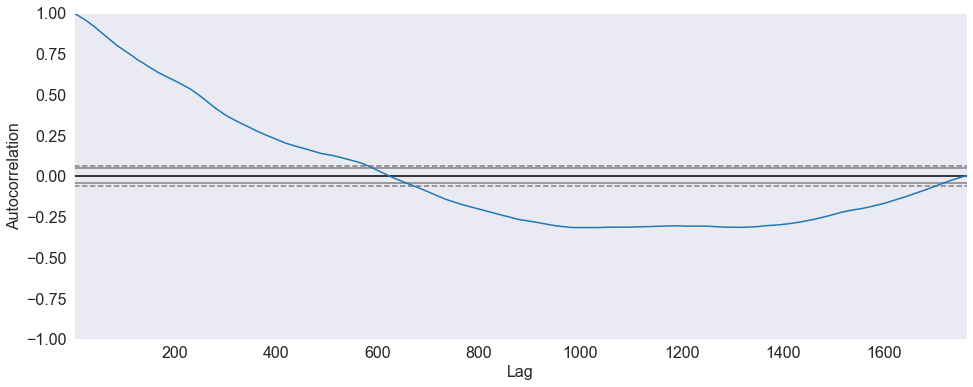

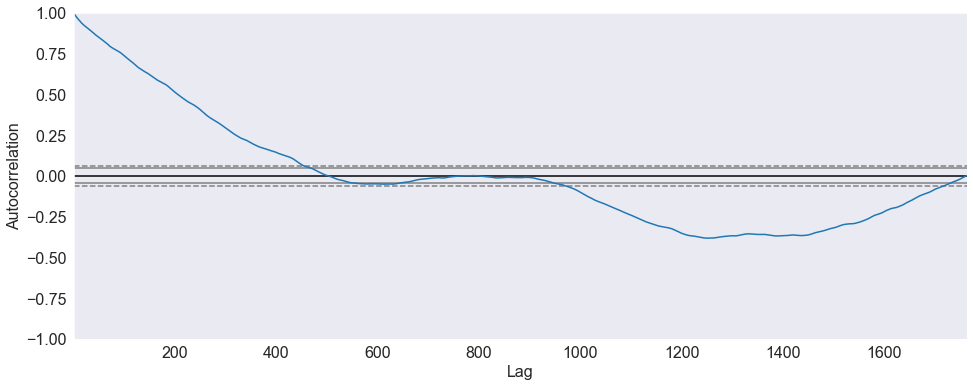

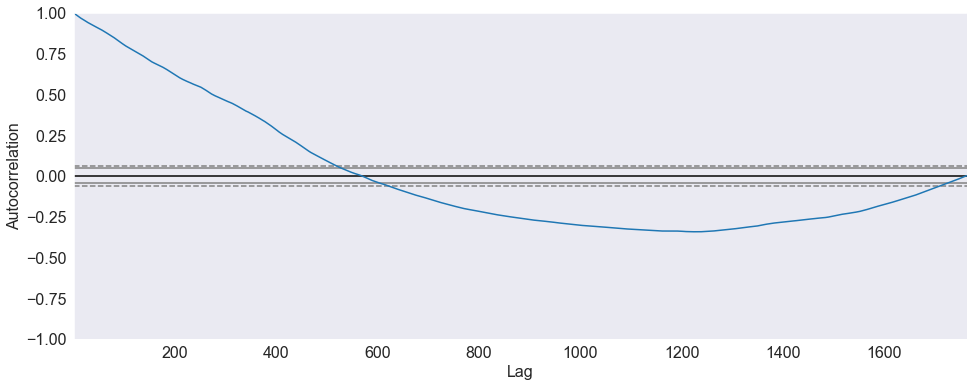

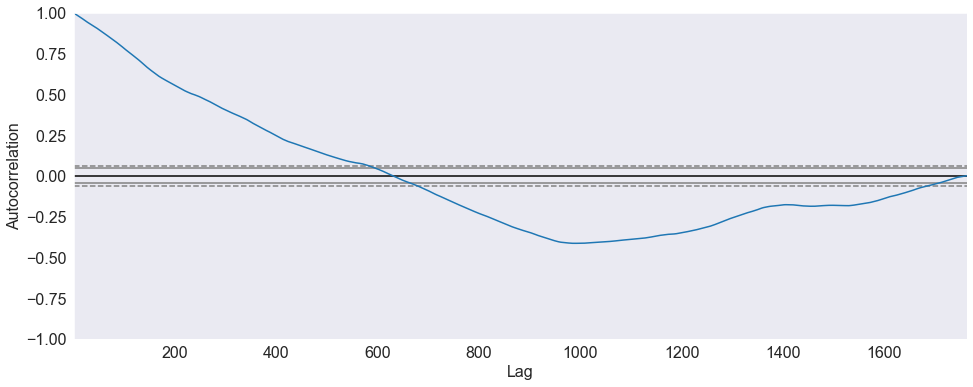

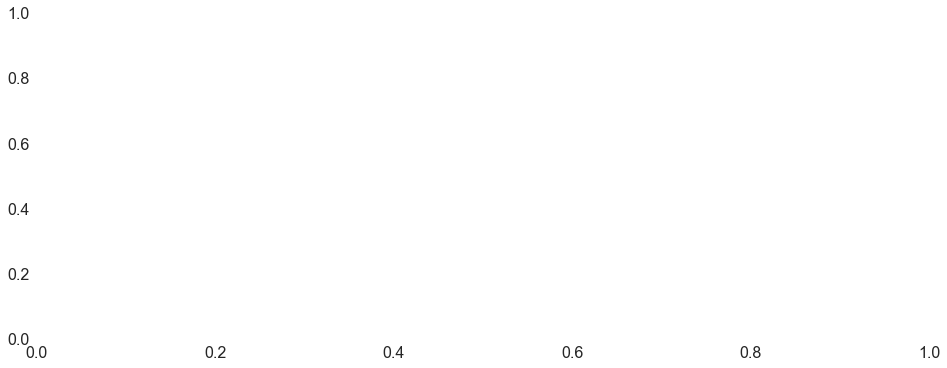

In [42]:
for col in arra[1].columns:
    plt.figure(figsize=(16,6))
    pd.plotting.autocorrelation_plot(arra[1][col])

ax = plt.axes()
ax.set_facecolor("white")    

# Observar la descomposición estacional de las acciones y comprobar su estacionalidad
for i in range(len(arra)):
  for col in arra[i].columns:   
    decomposition_additive = sm.tsa.seasonal_decompose(arra[i][col], model='additive', period=90)
    plt.rcParams.update({'figure.figsize': (10,10)})  
    decomposition_additive.plot().suptitle('Additive Decompose: '+ col, fontsize=22)
    plt.show()

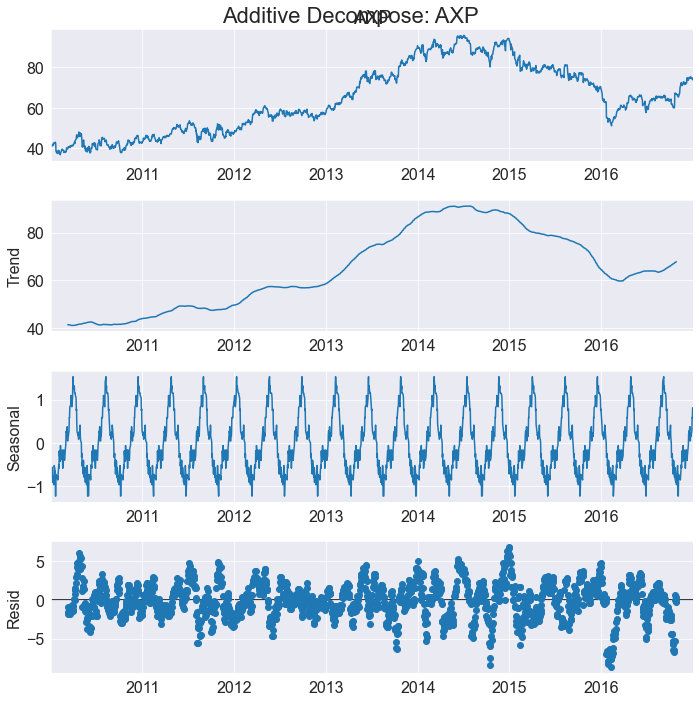

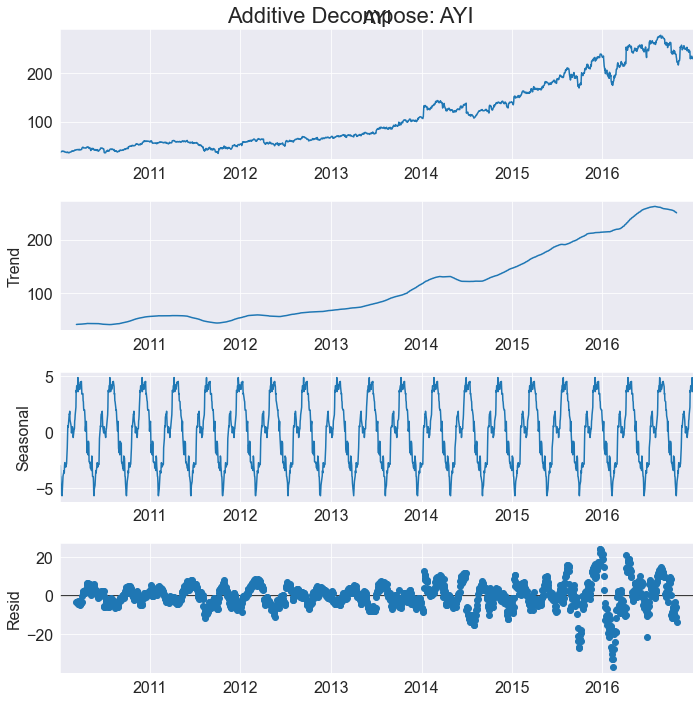

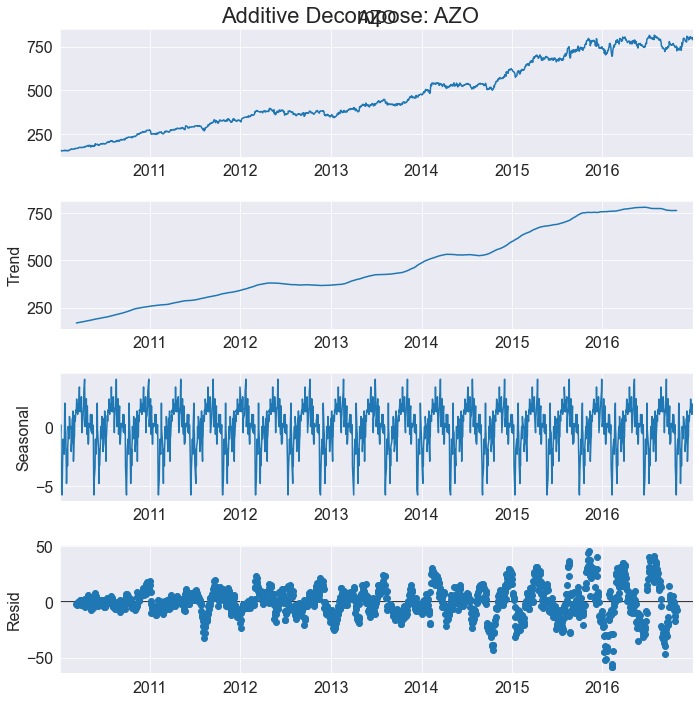

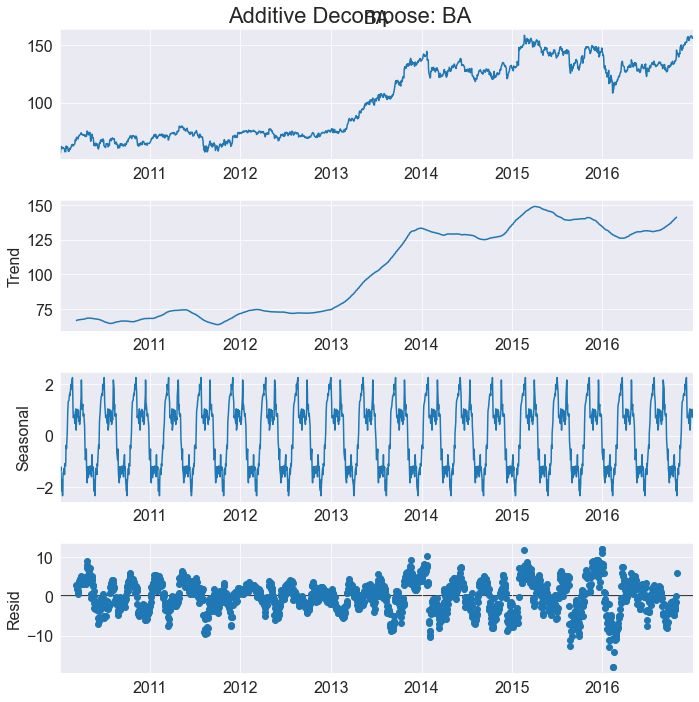

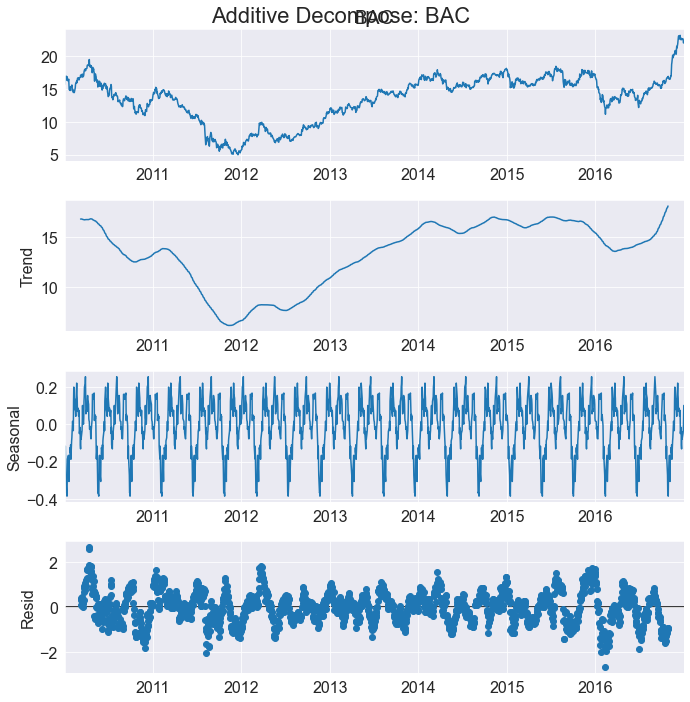

...

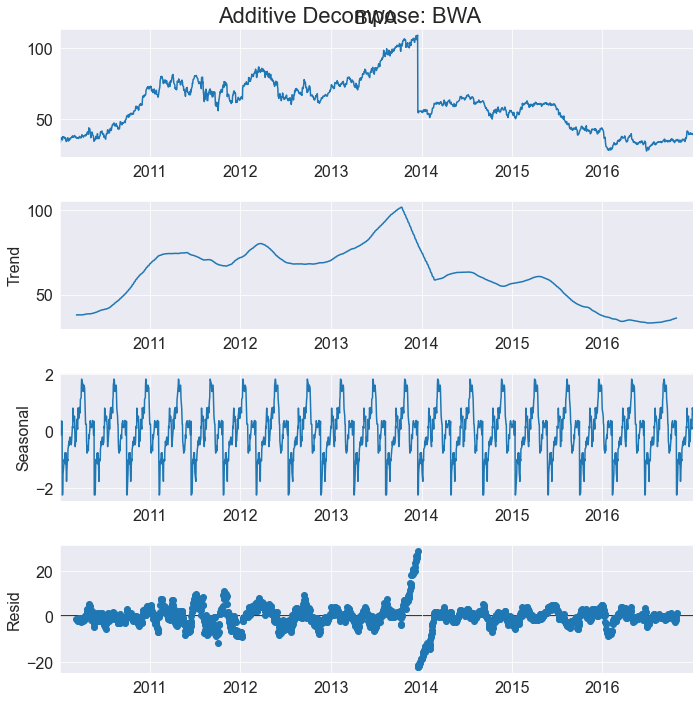

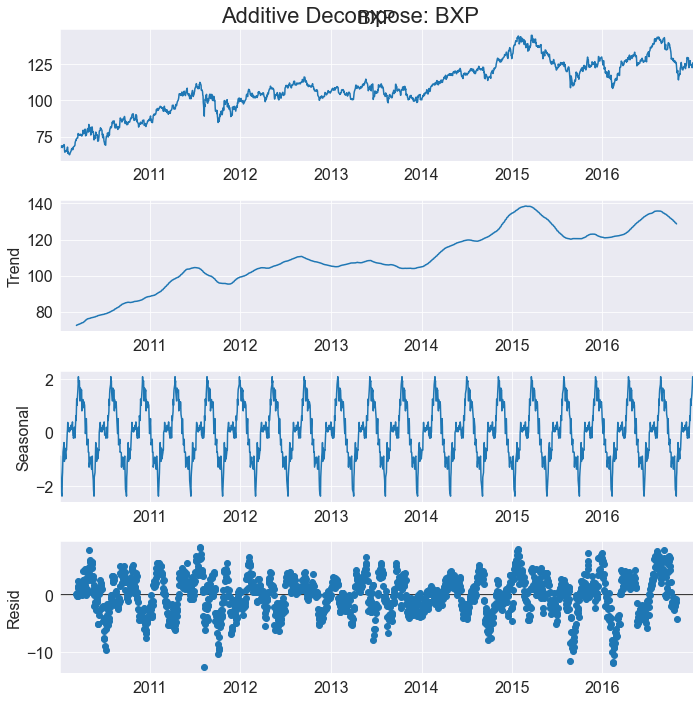

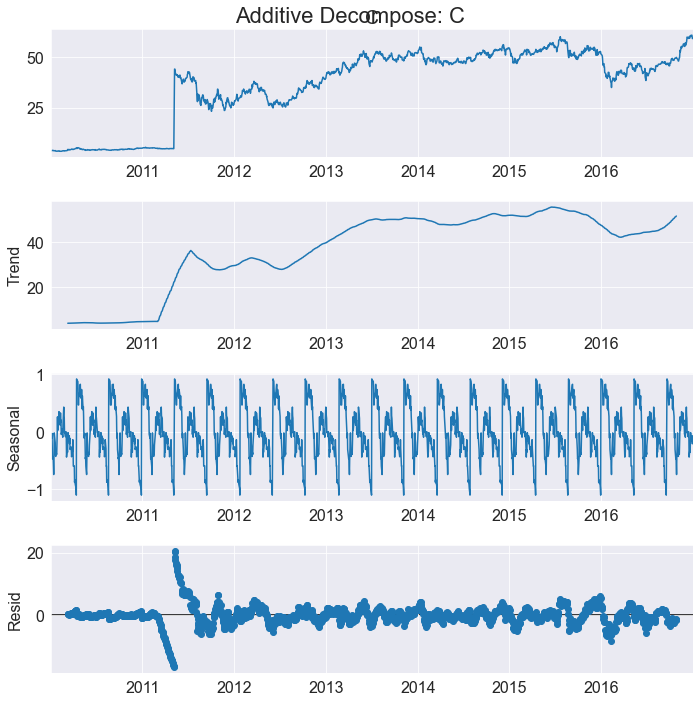

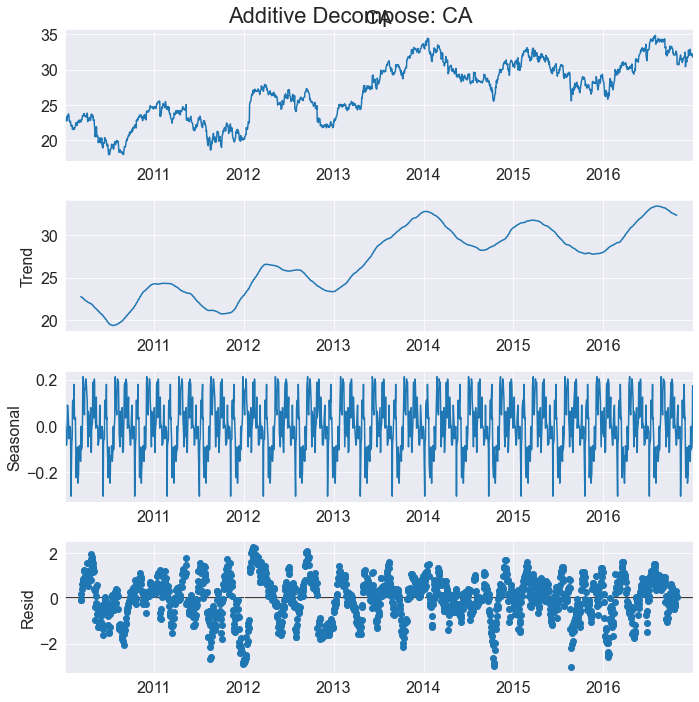

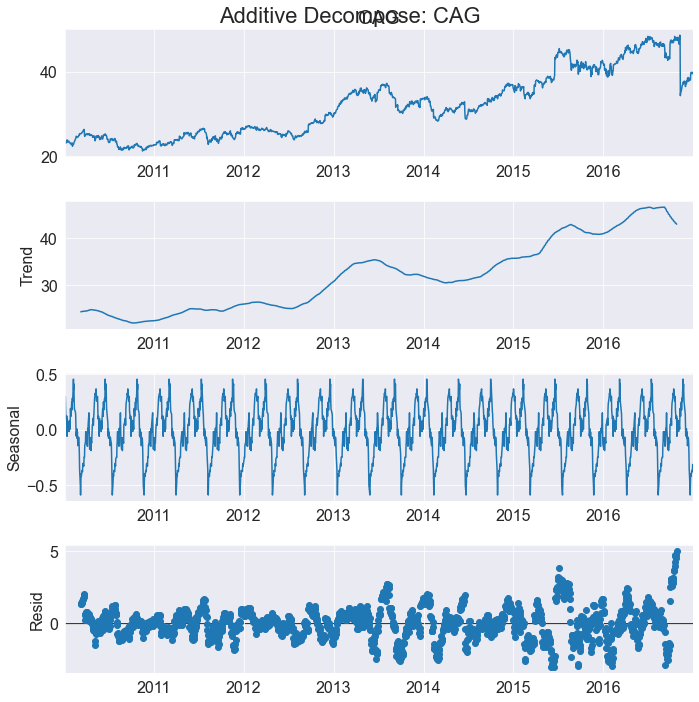

In [46]:
for col in arra[2].columns:   
    decomposition_additive = sm.tsa.seasonal_decompose(arra[2][col], model='additive', period=90)
    plt.rcParams.update({'figure.figsize': (10,10)})  
    decomposition_additive.plot().suptitle('Additive Decompose: '+ col, fontsize=22)
    plt.show()
      

In [35]:
big_p_value = feat_p_values.nlargest(50, 'p_values')

big_p_value

,Features,p_values
316,NVDA,1.000000
422,UNH,0.998489
309,NOC,0.998292
368,RSG,0.997545
108,CTAS,0.996258
45,AVGO,0.995021
449,WM,0.993446
391,STZ,0.992448
369,RTN,0.990717
138,EA,0.989750


In [36]:
feat_p_values.nsmallest(50, 'p_values')

,Features,p_values
164,FAST,0.009062
110,CTSH,0.020942
366,ROST,0.022085
29,AME,0.022104
144,EL,0.031353
256,LKQ,0.033419
157,ETR,0.033891
452,WU,0.044688
235,JCI,0.046453
150,EQR,0.047887


In [37]:
feat_p_values[feat_p_values['p_values'] > 0.6]

,Features,p_values
1,AAL,0.848142
2,AAP,0.794159
4,ABC,0.688056
6,ACN,0.928881
7,ADBE,0.983940
...,...,...
443,WBA,0.858506
444,WDC,0.720694
446,WFC,0.822042
448,WHR,0.769023


In [38]:
feat_p_values[feat_p_values['p_values'] < 0.6]

,Features,p_values
0,A,0.193826
3,AAPL,0.521635
5,ABT,0.219096
9,ADM,0.568831
15,AES,0.063218
...,...,...
451,WMT,0.443833
452,WU,0.044688
453,WY,0.084038
454,WYN,0.590232


Text(0.5, 1.15, 'Lag Plots of SP500 \n(Points get wide and scattered with increasing lag -> lesser correlation)\n')

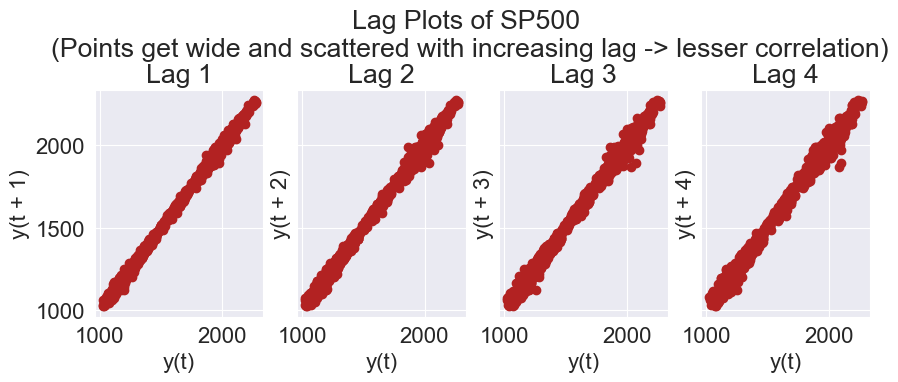

In [39]:
fig, axes = plt.subplots(1, 4, figsize=(10,3), sharex=True, sharey=True, dpi=100)
for i, ax in enumerate(axes.flatten()[:4]):
    lag_plot(sp500, lag=i+1, ax=ax, c='firebrick')
    ax.set_title('Lag ' + str(i+1))

fig.suptitle('Lag Plots of SP500 \n(Points get wide and scattered with increasing lag -> lesser correlation)\n', y=1.15)    


Los siguientes nos permiten calcular el histograma, y otras estadisticas de las acciones que nos brindan información sobre la distribución de cada features

#Calcular la Distribuci'on de las acciones y
for i in range(len(arra)):
  for col in arra[i].columns:   
    
    print(col,'\n')
    sns.displot(arra[i][col])
    plt.show()
    print("Skewness: %f" % arra[i][col].skew())
    print("Kurtosis: %f" % arra[i][col].kurt())
    print("Variance: %f" % arra[i][col].var())
    print("Mean: %f" % arra[i][col].mean())
    print('\n')

In [40]:
for col in arra[1].columns:   
    
    print(col,'\n')
    sns.displot(arra[1][col])
    plt.show()
    print("Skewness: %f" % arra[1][col].skew())
    print("Kurtosis: %f" % arra[1][col].kurt())
    print("Variance: %f" % arra[1][col].var())
    print("Mean: %f" % arra[1][col].mean())
    print('\n')

ALB 



AttributeError: module 'seaborn' has no attribute 'displot'


for i in range(len(arra)):
  for col in arra[i].columns:   
    smooth_arr = np.log1p(arra[i][col])
    
    print(col,'\n')
    sns.displot(smooth_arr)
    plt.show()
    print("Skewness: %f" % smooth_arr.skew())
    print("Kurtosis: %f" % smooth_arr.kurt())
    print("Variance: %f" % smooth_arr.var())
    print("Mean: %f" % smooth_arr.mean())
    print('\n')



In [ ]:
for col in arra[1].columns:   
    smooth_arr = np.log1p(arra[1][col])
    print(col,'\n')
    sns.displot(arra[1][col])
    plt.show()
    print("Skewness: %f" % arra[1][col].skew())
    print("Kurtosis: %f" % arra[1][col].kurt())
    print("Variance: %f" % arra[1][col].var())
    print("Mean: %f" % arra[1][col].mean())
    print('\n')

In [ ]:
test_SP500 = arra[1]

In [ ]:
print(test_SP500)

In [ ]:
test_SP500.dropna(axis=0, inplace=True)

Con el Test de Granger podemos comprobar la hipotesis de que la caracteristicas que se evalua con respecto a la variable objetivo se puede utilizar para predecir esa variable o no (p = 1, no se debe utilizar. p = 0 se puede utilizar)

In [ ]:
#https://www.machinelearningplus.com/time-series/time-series-analysis-python/

for col in df.columns:
    print(col)
    grangercausalitytests(df[['SP500', col]], maxlag=2)